In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/playground-series-s4e3/sample_submission.csv
/kaggle/input/playground-series-s4e3/train.csv
/kaggle/input/playground-series-s4e3/test.csv


## <div style="text-align: left; background-color:aliceblue ; font-family: Jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;">  Importing Required Libraries </div> 

In [2]:
# Libray for Data Manipulation.
import pandas as pd
import numpy as np

#Library for Data Visualization.
import seaborn as sns 
import matplotlib.pyplot as plt
import altair as alt
import matplotlib.ticker as ticker
sns.set(style="white",font_scale=1.5)
sns.set(rc={"axes.facecolor":"#FFFAF0","figure.facecolor":"#FFFAF0"})
sns.set_context("poster",font_scale = .7)

# Library to overcome Warnings.
import warnings
warnings.filterwarnings('ignore')

# Library to perform Statistical Analysis.
from scipy import stats
from scipy.stats import chi2
from scipy.stats import chi2_contingency

# Library to Display whole Dataset.
pd.set_option("display.max.columns",100)


## <div style="text-align: left; background-color:aliceblue ; font-family: Jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;">  Loading Dataset </div> 

In [3]:
train_df = pd.read_csv('/kaggle/input/playground-series-s4e3/train.csv')
test_df = pd.read_csv('/kaggle/input/playground-series-s4e3/test.csv')

In [4]:
train_df

,id,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults
0,0,584,590,909972,909977,16,8,5,2274,113,140,1358,0,1,50,0.7393,0.4000,0.5000,0.0059,1.0000,1.0000,0.0,1.2041,0.9031,0.6990,-0.5000,-0.0104,0.1417,0,0,0,1,0,0,0
1,1,808,816,728350,728372,433,20,54,44478,70,111,1687,1,0,80,0.7772,0.2878,0.2581,0.0044,0.2500,1.0000,1.0,2.6365,0.7782,1.7324,0.7419,-0.2997,0.9491,0,0,0,0,0,0,1
2,2,39,192,2212076,2212144,11388,705,420,1311391,29,141,1400,0,1,40,0.0557,0.5282,0.9895,0.1077,0.2363,0.3857,0.0,4.0564,2.1790,2.2095,-0.0105,-0.0944,1.0000,0,0,1,0,0,0,0
3,3,781,789,3353146,3353173,210,16,29,3202,114,134,1387,0,1,40,0.7202,0.3333,0.3333,0.0044,0.3750,0.9310,1.0,2.3222,0.7782,1.4314,0.6667,-0.0402,0.4025,0,0,1,0,0,0,0
4,4,1540,1560,618457,618502,521,72,67,48231,82,111,1692,0,1,300,0.1211,0.5347,0.0842,0.0192,0.2105,0.9861,1.0,2.7694,1.4150,1.8808,0.9158,-0.2455,0.9998,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19214,19214,749,757,143210,143219,17,4,4,2193,122,140,1360,0,0,50,0.8950,0.1500,0.8571,0.0044,1.0000,0.8000,0.0,1.2305,0.7782,0.6021,-0.1429,0.0044,0.2901,0,0,0,1,0,0,0
19215,19215,723,735,2488529,2488541,231,17,26,27135,104,133,1652,1,0,70,0.9243,0.3254,0.2778,0.0065,0.7333,0.9216,1.0,2.3636,1.0414,1.4150,0.7222,-0.0989,0.5378,0,0,0,0,0,0,1
19216,19216,6,31,1578055,1578129,780,114,98,71112,41,94,1358,0,1,200,0.0148,0.4331,0.2281,0.0199,0.1862,0.9554,1.0,2.8921,1.4314,1.8692,0.7719,-0.4283,0.9997,1,0,0,0,0,0,0
19217,19217,9,18,1713172,1713184,126,13,26,14808,88,132,1692,1,0,60,0.0192,0.2361,0.0390,0.0068,0.7692,1.0000,1.0,2.1004,1.0414,1.4150,0.9610,-0.1162,0.3509,0,0,0,0,0,0,1


In [5]:
test_df.head()

,id,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas
0,19219,1015,1033,3826564,3826588,659,23,46,62357,67,127,1656,0,1,150,0.3877,0.4896,0.3273,0.0095,0.5652,1.0000,1.0,2.8410,1.1139,1.6628,0.6727,-0.2261,0.9172
1,19220,1257,1271,419960,419973,370,26,28,39293,92,132,1354,0,1,40,0.1629,0.4136,0.0938,0.0047,0.2414,1.0000,1.0,2.5682,0.9031,1.4472,0.9063,-0.1453,0.9104
2,19221,1358,1372,117715,117724,289,36,32,29386,101,134,1360,0,1,40,0.0609,0.6234,0.4762,0.0155,0.6000,0.7500,0.0,2.4609,1.3222,1.3222,-0.5238,-0.0435,0.6514
3,19222,158,168,232415,232440,80,10,11,8586,107,140,1690,1,0,100,0.4439,0.3333,0.8182,0.0037,0.8000,1.0000,1.0,1.9031,0.6990,1.0414,0.1818,-0.0738,0.2051
4,19223,559,592,544375,544389,140,19,15,15524,103,134,1688,1,0,60,0.8191,0.2619,0.4286,0.0158,0.8421,0.5333,0.0,2.1461,1.3222,1.1461,-0.5714,-0.0894,0.4170


### Understanding about features and Target variable:

1. **id**: Unique identifier for each observation.
2. **X_Minimum**: The minimum x-coordinate of the defect.
3. **X_Maximum**: The maximum x-coordinate of the defect.
4. **Y_Minimum**: The minimum y-coordinate of the defect.
5. **Y_Maximum**: The maximum y-coordinate of the defect.
6. **Pixels_Areas**: Area of the defect in pixels.
7. **X_Perimeter**: Perimeter of the defect in the x-direction.
8. **Y_Perimeter**: Perimeter of the defect in the y-direction.
9. **Sum_of_Luminosity**: Sum of luminosity values within the defect area.
10. **Minimum_of_Luminosity**: Minimum luminosity value within the defect area.
11. **Maximum_of_Luminosity**: Maximum luminosity value within the defect area.
12. **Length_of_Conveyer**: Length of the conveyer belt during the inspection.
13. **TypeOfSteel_A300**: Binary indicator for steel type A300.
14. **TypeOfSteel_A400**: Binary indicator for steel type A400.
15. **Steel_Plate_Thickness**: Thickness of the steel plate.
16. **Edges_Index**: Index indicating the ratio of the perimeter to the square root of the area.
17. **Empty_Index**: Index indicating the ratio of the defect area to the entire image area.
18. **Square_Index**: Index indicating the ratio of the defect area to the area of the smallest rectangle circumscribing the defect.
19. **Outside_X_Index**: Index indicating the ratio of the number of pixels on the edges in the x-direction to the total number of pixels on the defect boundary.
20. **Edges_X_Index**: Index indicating the ratio of the number of edges in the x-direction to the total number of edges.
21. **Edges_Y_Index**: Index indicating the ratio of the number of edges in the y-direction to the total number of edges.
22. **Outside_Global_Index**: Index indicating the ratio of the number of exterior defects to the total number of defects.
23. **LogOfAreas**: Logarithm of the defect areas.
24. **Log_X_Index**: Index indicating the ratio of the number of connected pixels in the x-direction to the total number of pixels.
25. **Log_Y_Index**: Index indicating the ratio of the number of connected pixels in the y-direction to the total number of pixels.
26. **Orientation_Index**: Index indicating the orientation of the defect.
27. **Luminosity_Index**: Index indicating the difference between the maximum and minimum luminosity values within the defect area.
28. **SigmoidOfAreas**: Sigmoid function applied to the defect areas.

### Target Variable:

The target variable seems to indicate the type of fault present in the steel plate. It includes categories such as:
- **Pastry**
- **Z_Scratch**
- **K_Scatch**
- **Stains**
- **Dirtiness**
- **Bumps**
- **Other_Faults**

Each of these categories likely represents a different type of defect that can occur on the steel plate. The goal would typically be to predict the type of fault based on the features provided in the dataset. This is likely a multi-class classification problem.

Understanding these features and the target variable is crucial for building a machine learning model to predict the type of defects on the steel plate accurately.

## <div style="text-align: left; background-color:aliceblue ; font-family: Jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;">  Data Wrangling </div> 

#### 1. Computing Dimension of Dataset

In [6]:
print('dataset shape: ', train_df.shape)

dataset shape:  (19219, 35)


In [7]:
print('dataset shape: ', test_df.shape)

dataset shape:  (12814, 28)


<div style="border-radius:10px; border:#808080 dashed; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=brown> 🔍 Inference:</font></h3>

* There is total **19219 records** and **35 columns** availabe in the train_dataset.
* There is total **12814 records** and **28 columns** availabe in the test_dataset.

#### 2. Statistical Summary of Dataset

In [8]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19219 entries, 0 to 19218
Data columns (total 35 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     19219 non-null  int64  
 1   X_Minimum              19219 non-null  int64  
 2   X_Maximum              19219 non-null  int64  
 3   Y_Minimum              19219 non-null  int64  
 4   Y_Maximum              19219 non-null  int64  
 5   Pixels_Areas           19219 non-null  int64  
 6   X_Perimeter            19219 non-null  int64  
 7   Y_Perimeter            19219 non-null  int64  
 8   Sum_of_Luminosity      19219 non-null  int64  
 9   Minimum_of_Luminosity  19219 non-null  int64  
 10  Maximum_of_Luminosity  19219 non-null  int64  
 11  Length_of_Conveyer     19219 non-null  int64  
 12  TypeOfSteel_A300       19219 non-null  int64  
 13  TypeOfSteel_A400       19219 non-null  int64  
 14  Steel_Plate_Thickness  19219 non-null  int64  
 15  Ed

In [9]:
# Identify the data types of columns
column_data_types = train_df.dtypes

# Count the numerical and categorical columns
numerical_count = 0
categorical_count = 0

for column_name, data_type in column_data_types.items():
    if np.issubdtype(data_type, np.number):
        numerical_count += 1
    else:
        categorical_count += 1

# Print the counts
print(f"There are {numerical_count} Numerical Columns in dataset")
print(f"There are {categorical_count} Categorical Columns in dataset")

There are 35 Numerical Columns in dataset
There are 0 Categorical Columns in dataset


#### 5. Checking if There's Any Duplicate Records.

In [10]:
print("Duplicates in Dataset: ",train_df.duplicated().sum())

Duplicates in Dataset:  0


<div style="border-radius:10px; border:#808080 dashed; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=brown> 🔍 Inference:</font></h3>

* There are no duplicate records present in the dataset.

#### 6. Computing Total No. of Missing Values and the Percentage of Missing Values

In [11]:
missing_data = train_df.isnull().sum().to_frame().rename(columns={0:"Total No. of Missing Values"})
missing_data["% of Missing Values"] = round((missing_data["Total No. of Missing Values"]/len(train_df))*100,2)
missing_data

,Total No. of Missing Values,% of Missing Values
id,0,0.0
X_Minimum,0,0.0
X_Maximum,0,0.0
Y_Minimum,0,0.0
Y_Maximum,0,0.0
Pixels_Areas,0,0.0
X_Perimeter,0,0.0
Y_Perimeter,0,0.0
Sum_of_Luminosity,0,0.0
Minimum_of_Luminosity,0,0.0


<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=brown> 🔍 Inference:</font></h3>

* None of the Attribute are having Missing Values.  

#### 7. Performing Descriptive Analysis

In [12]:
round(train_df.describe().T,2)

,count,mean,std,min,25%,50%,75%,max
id,19219.0,9609.00,5548.19,0.00,4804.50,9609.00,14413.50,19218.00
X_Minimum,19219.0,709.85,531.54,0.00,49.00,777.00,1152.00,1705.00
X_Maximum,19219.0,753.86,499.84,4.00,214.00,796.00,1165.00,1713.00
Y_Minimum,19219.0,1849756.04,1903553.85,6712.00,657468.00,1398169.00,2368032.00,12987661.00
Y_Maximum,19219.0,1846605.35,1896295.14,6724.00,657502.00,1398179.00,2362511.00,12987692.00
Pixels_Areas,19219.0,1683.99,3730.32,6.00,89.00,168.00,653.00,152655.00
X_Perimeter,19219.0,95.65,177.82,2.00,15.00,25.00,64.00,7553.00
Y_Perimeter,19219.0,64.12,101.05,1.00,14.00,23.00,61.00,903.00
Sum_of_Luminosity,19219.0,191846.68,442024.69,250.00,9848.00,18238.00,67978.00,11591414.00
Minimum_of_Luminosity,19219.0,84.81,28.80,0.00,70.00,90.00,105.00,196.00


In [13]:
round(test_df.describe().T,2)

,count,mean,std,min,25%,50%,75%,max
id,12814.0,25625.50,3699.23,19219.00,22422.25,25625.50,28828.75,32032.00
X_Minimum,12814.0,709.33,531.88,0.00,46.00,776.00,1152.00,1688.00
X_Maximum,12814.0,753.27,500.74,4.00,214.00,796.00,1167.00,1712.00
Y_Minimum,12814.0,1846533.46,1916427.39,6712.00,640173.75,1378890.50,2368032.00,12987661.00
Y_Maximum,12814.0,1842029.49,1911425.61,6724.00,639857.00,1378588.00,2356237.50,12987692.00
Pixels_Areas,12814.0,1672.91,3725.52,4.00,91.00,169.00,649.00,152655.00
X_Perimeter,12814.0,96.46,219.93,2.00,15.00,24.00,64.00,10449.00
Y_Perimeter,12814.0,64.73,188.51,2.00,14.00,24.00,60.00,18152.00
Sum_of_Luminosity,12814.0,192689.30,481287.15,535.00,9968.00,18402.00,66960.25,11591414.00
Minimum_of_Luminosity,12814.0,84.55,28.71,0.00,68.00,90.00,105.00,203.00


<div style="border-radius:10px; border:#808080 dashed; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=brown> 🔍 Inference:</font></h3>

* The Minimum Pixels_Areas is 4 which conveys that some steel sheets are too small.


#### 8. Dropping Attritbutes which doesn't imply any meaningful insights in our analysis.

In [14]:
cols = ["id"]
train_df.drop(columns=cols, inplace=True)
test_df.drop(columns=cols, inplace=True)

## <div style="text-align: left; background-color:aliceblue ; font-family: Jokerman ; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Exploratory Data Analysis (EDA) </div> 

In [15]:
#creating a 'Fault_type column for EDA purpose '
train_df['Fault_Type'] = train_df[['Pastry', 'Z_Scratch', 'K_Scatch', 'Stains', 'Dirtiness', 'Bumps', 'Other_Faults']].idxmax(axis=1)

#### 1. Visualizing the Distribution of each Fault_Type class

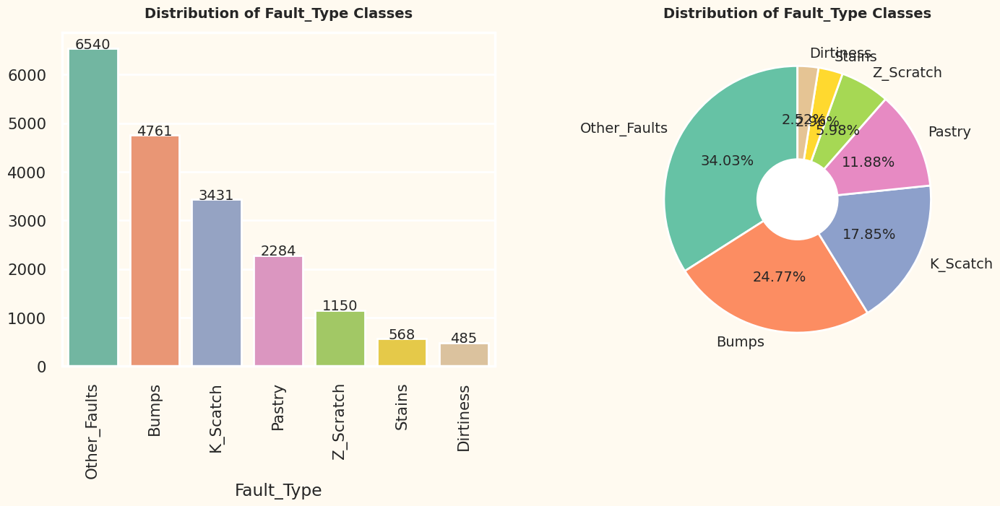

In [16]:
# Visualization to show distribution of Fault_Type classes
plt.figure(figsize=(17, 6))
plt.subplot(1, 2, 1)
Fault_Type_counts = train_df["Fault_Type"].value_counts()
sns.barplot(x=Fault_Type_counts.index, y=Fault_Type_counts.values, palette='Set2')
plt.title("Distribution of Fault_Type Classes", fontweight="black", size=14, pad=15)
for i, v in enumerate(Fault_Type_counts.values):
    plt.text(i, v, v, ha="center", fontsize=14)
plt.xticks(rotation=90)
# Visualization to show distribution of Fault_Type classes in percentage
plt.subplot(1, 2, 2)
colors = sns.color_palette('Set2', len(Fault_Type_counts))
plt.pie(Fault_Type_counts, labels=Fault_Type_counts.index, autopct="%.2f%%", textprops={"size": 14},
        colors=colors, startangle=90)
center_circle = plt.Circle((0, 0), 0.3, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)
plt.title("Distribution of Fault_Type Classes", fontweight="black", size=14, pad=15)
plt.show()


<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=brown> 🔍 Inference:</font></h3>

* Pastry have 11.88% distribution
* Z_Scratch have 5.98% distribution
* K_Scatch have 17.85% distribution
* Stains have 2.96% distribution
* Dirtiness have 2.52% distribution
* Bumps have 24.77% distribution
* Other_Faults have 34.03% distribution

#### 2. Visualising the distribution of each features

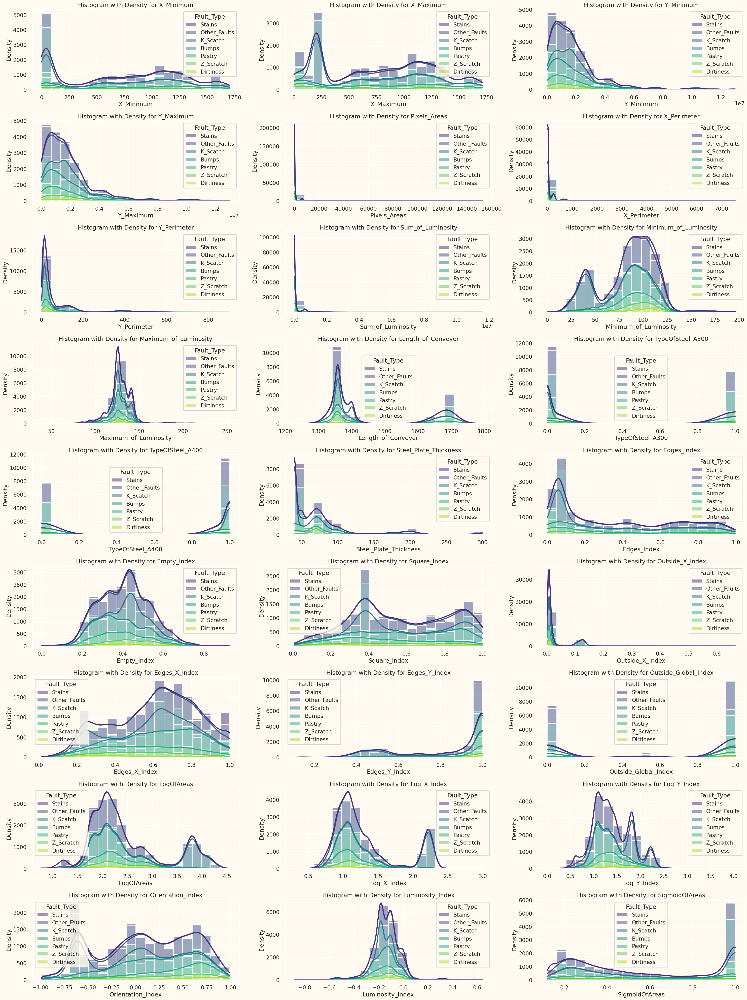

In [17]:
numerical_features = ['X_Minimum', 'X_Maximum', 'Y_Minimum', 'Y_Maximum', 'Pixels_Areas',
                      'X_Perimeter', 'Y_Perimeter', 'Sum_of_Luminosity', 'Minimum_of_Luminosity',
                      'Maximum_of_Luminosity', 'Length_of_Conveyer', 'TypeOfSteel_A300',
                      'TypeOfSteel_A400', 'Steel_Plate_Thickness', 'Edges_Index', 'Empty_Index',
                      'Square_Index', 'Outside_X_Index', 'Edges_X_Index', 'Edges_Y_Index',
                      'Outside_Global_Index', 'LogOfAreas', 'Log_X_Index', 'Log_Y_Index',
                      'Orientation_Index', 'Luminosity_Index', 'SigmoidOfAreas']

# Set the figure size and arrange plots horizontally in pairs
fig, axes = plt.subplots(nrows=(len(numerical_features) + 2) // 3, ncols=3, figsize=(30, 40))

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Loop through the selected columns and create histograms with density
for i, col in enumerate(numerical_features):
    sns.histplot(data=train_df, x=col, hue='Fault_Type', multiple="stack", bins=20, kde=True, palette='viridis', ax=axes[i])
    axes[i].set_title(f'Histogram with Density for {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Density')

# Remove any empty subplots if the number of columns is odd
if len(numerical_features) % 3 != 0:
    for j in range(len(numerical_features) % 3, 3):
        fig.delaxes(axes[-j - 1])

plt.tight_layout()
plt.show()


**From these plots we can make the following conclusions about the features' distributions:**

- Normal: Maximum_of_Luminosity, Empty_Index, Square_Index, and Luminosity_Index
- Close to normal: Minimum_of_Luminosity, and Orientation_Index
- Skewed to the right: Y_Minimum, Y_Maximum, Pixels_Areas, X_Perimeter, Y_Perimeter, and Sum_of_Luminosity
- Close to skewed to the right: Log_Y_Index
- Close to skewed to the left: Edges_X_Index
- Close to uniform: X_Minimum, X_Maximum, EdgesIndex, Edges_Y_Index, and SigmoidOfAreas

#### The features not mentioned have distributions that we are unable to categorise.

#### We will later perform transformations on the features that fell into the categories: Close to normal, Skewed to the right, Close to skewed to the right, and Close to skewed to the left. We aim to transform the values in such a way that their distributions become more normal.

In [18]:
def transform(X):
    eps=1e-5
    X['Sum_of_Luminosity']=np.log(X['Sum_of_Luminosity']+eps)
    X['Pixels_Areas']=np.log(X['Pixels_Areas']+eps)
    X['X_Perimeter']=np.log(X['X_Perimeter']+eps)
    X['Steel_Plate_Thickness']=np.log(X['Steel_Plate_Thickness']+eps)
    X['Y_Perimeter']=np.log(X['Y_Perimeter']+eps)
    X['Outside_X_Index']=np.log(X['Outside_X_Index']+eps)
    X['Y_Minimum']=np.log(X['Y_Minimum']+eps)
    X['Y_Maximum']=np.log(X['Y_Maximum']+eps)
    return X

In [19]:
transform(train_df)

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults,Fault_Type
0,584,590,13.721169,13.721175,2.772589,2.079443,1.609440,7.729296,113,140,1358,0,1,3.912023,0.7393,0.4000,0.5000,-5.131109,1.0000,1.0000,0.0,1.2041,0.9031,0.6990,-0.5000,-0.0104,0.1417,0,0,0,1,0,0,0,Stains
1,808,816,13.498537,13.498567,6.070738,2.995733,3.988984,10.702750,70,111,1687,1,0,4.382027,0.7772,0.2878,0.2581,-5.423881,0.2500,1.0000,1.0,2.6365,0.7782,1.7324,0.7419,-0.2997,0.9491,0,0,0,0,0,0,1,Other_Faults
2,39,192,14.609442,14.609473,9.340315,6.558198,6.040255,14.086599,29,141,1400,0,1,3.688880,0.0557,0.5282,0.9895,-2.228313,0.2363,0.3857,0.0,4.0564,2.1790,2.2095,-0.0105,-0.0944,1.0000,0,0,1,0,0,0,0,K_Scatch
3,781,789,15.025410,15.025418,5.347108,2.772589,3.367296,8.071531,114,134,1387,0,1,3.688880,0.7202,0.3333,0.3333,-5.423881,0.3750,0.9310,1.0,2.3222,0.7782,1.4314,0.6667,-0.0402,0.4025,0,0,1,0,0,0,0,K_Scatch
4,1540,1560,13.334983,13.335056,6.255750,4.276666,4.204693,10.783757,82,111,1692,0,1,5.703783,0.1211,0.5347,0.0842,-3.952324,0.2105,0.9861,1.0,2.7694,1.4150,1.8808,0.9158,-0.2455,0.9998,0,0,0,0,0,0,1,Other_Faults
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19214,749,757,11.872067,11.872130,2.833214,1.386297,1.386297,7.693026,122,140,1360,0,0,3.912023,0.8950,0.1500,0.8571,-5.423881,1.0000,0.8000,0.0,1.2305,0.7782,0.6021,-0.1429,0.0044,0.2901,0,0,0,1,0,0,0,Stains
19215,723,735,14.727202,14.727207,5.442418,2.833214,3.258097,10.208580,104,133,1652,1,0,4.248495,0.9243,0.3254,0.2778,-5.034416,0.7333,0.9216,1.0,2.3636,1.0414,1.4150,0.7222,-0.0989,0.5378,0,0,0,0,0,0,1,Other_Faults
19216,6,31,14.271704,14.271751,6.659294,4.736199,4.584968,11.172011,41,94,1358,0,1,5.298317,0.0148,0.4331,0.2281,-3.916533,0.1862,0.9554,1.0,2.8921,1.4314,1.8692,0.7719,-0.4283,0.9997,1,0,0,0,0,0,0,Pastry
19217,9,18,14.353857,14.353864,4.836282,2.564950,3.258097,9.602923,88,132,1692,1,0,4.094345,0.0192,0.2361,0.0390,-4.989363,0.7692,1.0000,1.0,2.1004,1.0414,1.4150,0.9610,-0.1162,0.3509,0,0,0,0,0,0,1,Other_Faults


In [20]:
transform(test_df)

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas
0,1015,1033,15.157478,15.157484,6.490724,3.135495,3.828642,11.040631,67,127,1656,0,1,5.010635,0.3877,0.4896,0.3273,-4.655411,0.5652,1.0000,1.0,2.8410,1.1139,1.6628,0.6727,-0.2261,0.9172
1,1257,1271,12.947915,12.947946,5.913503,3.258097,3.332205,10.578802,92,132,1354,0,1,3.688880,0.1629,0.4136,0.0938,-5.358067,0.2414,1.0000,1.0,2.5682,0.9031,1.4472,0.9063,-0.1453,0.9104
2,1358,1372,11.676022,11.676098,5.666427,3.583519,3.465736,10.288274,101,134,1360,0,1,3.688880,0.0609,0.6234,0.4762,-4.166270,0.6000,0.7500,0.0,2.4609,1.3222,1.3222,-0.5238,-0.0435,0.6514
3,158,168,12.356280,12.356387,4.382027,2.302586,2.397896,9.057888,107,140,1690,1,0,4.605170,0.4439,0.3333,0.8182,-5.596723,0.8000,1.0000,1.0,1.9031,0.6990,1.0414,0.1818,-0.0738,0.2051
4,559,592,13.207394,13.207419,4.941642,2.944440,2.708051,9.650142,103,134,1688,1,0,4.094345,0.8191,0.2619,0.4286,-4.147113,0.8421,0.5333,0.0,2.1461,1.3222,1.1461,-0.5714,-0.0894,0.4170
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12809,1101,1116,13.012421,13.012531,5.746203,3.465736,3.610918,9.980587,79,103,1353,0,1,4.248495,0.2853,0.3050,0.2339,-4.373265,0.4063,0.9194,1.0,2.4955,1.2305,1.6335,0.7661,-0.3109,0.8894
12810,1289,1306,14.962752,14.962768,4.077538,2.197226,2.890372,8.565793,113,141,1362,0,1,3.688880,0.0106,0.2778,0.2778,-5.257175,0.7778,1.0000,1.0,1.7708,0.8451,1.2553,0.7222,-0.0448,0.1954
12811,41,210,14.277693,14.277476,9.716194,6.679599,6.257668,14.435098,24,143,1400,0,1,3.688880,0.0557,0.5644,0.9371,-2.090624,0.2199,0.4097,0.0,4.2525,2.2504,2.2672,-0.0629,-0.0801,1.0000
12812,1329,1340,13.462026,13.462069,5.955837,3.761200,3.526361,10.515289,66,124,1364,0,1,3.688880,0.0133,0.1814,0.1539,-4.655411,0.2407,1.0000,1.0,2.5866,1.1139,1.5911,0.8461,-0.2629,0.7844


## <div style="text-align: left; background-color:aliceblue ; font-family: JokerMan; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Featutre Engineering and data preparation </div> 

#### 1. Statistical Test

In [21]:
df = train_df.copy()

In [22]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
df = sm.add_constant(df.select_dtypes(include=[np.number]))
vif = pd.DataFrame()
vif["Variable"] = df.columns
vif["VIF"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
vif

,Variable,VIF
0,const,5440.850265
1,X_Minimum,99.572533
2,X_Maximum,88.528173
3,Y_Minimum,14.584631
4,Y_Maximum,14.593199
5,Pixels_Areas,115.140795
6,X_Perimeter,29.532667
7,Y_Perimeter,38.093341
8,Sum_of_Luminosity,18.581795
9,Minimum_of_Luminosity,6.475479


- VIF <= 1: Not correlated.
- 1 < VIF < 5: Moderately correlated.
- VIF >= 5: Highly correlated (some sources use a threshold of 10)

In [23]:
highly_correlated_variable = []
for index,row in vif.iterrows():
    if row['VIF']>6.5:
        highly_correlated_variable.append(row['Variable'])
highly_correlated_variable.remove('const')
print(highly_correlated_variable)

['X_Minimum', 'X_Maximum', 'Y_Minimum', 'Y_Maximum', 'Pixels_Areas', 'X_Perimeter', 'Y_Perimeter', 'Sum_of_Luminosity', 'TypeOfSteel_A300', 'TypeOfSteel_A400', 'Outside_X_Index', 'LogOfAreas', 'Log_X_Index', 'Log_Y_Index', 'Orientation_Index', 'Luminosity_Index', 'SigmoidOfAreas']


In [24]:
import numpy as np
epsilon = 1e-5
def generate_features(X):
    
    # Location Features
    X['X_Distance'] = X['X_Maximum'] - X['X_Minimum']
    X['Y_Distance'] = X['Y_Maximum'] - X['Y_Minimum']

    # Density Feature
    #X['Density'] = X['Pixels_Areas'] / (X['X_Perimeter'] + X['Y_Perimeter'])

    # Relative Perimeter Feature
    X['Relative_Perimeter'] = X['X_Perimeter'] / (X['X_Perimeter'] + X['Y_Perimeter'] + epsilon)

    # Circularity Feature
    #X['Circularity'] = X['Pixels_Areas'] / (X['X_Perimeter'] ** 2)

    # Symmetry Index Feature
    #X['Symmetry_Index'] = np.abs(X['X_Distance'] - X['Y_Distance']) / (X['X_Distance'] + X['Y_Distance'] + epsilon)

    # Color Contrast Feature
    X['Color_Contrast'] = X['Maximum_of_Luminosity'] - X['Minimum_of_Luminosity']

    # Combined Geometric Index Feature
    #X['Combined_Geometric_Index'] = X['Edges_Index'] * X['Square_Index']

    # Interaction Term Feature
    #X['X_Distance*Pixels_Areas'] = X['X_Distance'] * X['Pixels_Areas']

    # Additional Features
    #X['sin_orientation'] = np.sin(X['Orientation_Index'])
    #X['Edges_Index2'] = np.exp(X['Edges_Index'] + epsilon)
    #X['X_Maximum2'] = np.sin(X['X_Maximum'])
    #X['Y_Minimum2'] = np.sin(X['Y_Minimum'])
    #X['Aspect_Ratio_Pixels'] = np.where(X['Y_Perimeter'] == 0, 0, X['X_Perimeter'] / X['Y_Perimeter'])
    #X['Aspect_Ratio'] = np.where(X['Y_Distance'] == 0, 0, X['X_Distance'] / X['Y_Distance'])

    # Average Luminosity Feature
    #X['Average_Luminosity'] = (X['Sum_of_Luminosity'] + X['Minimum_of_Luminosity']) / 2

    # Normalized Steel Thickness Feature
    #X['Normalized_Steel_Thickness'] = (X['Steel_Plate_Thickness'] - X['Steel_Plate_Thickness'].min()) / (X['Steel_Plate_Thickness'].max() - X['Steel_Plate_Thickness'].min())

    # Logarithmic Features
    #X['Log_Perimeter'] = np.log(X['X_Perimeter'] + X['Y_Perimeter'] + epsilon)
    #X['Log_Luminosity'] = np.log(X['Sum_of_Luminosity'] + epsilon)
    #X['Log_Aspect_Ratio'] = np.log(X['Aspect_Ratio'] ** 2 + epsilon)

    # Statistical Features
    #X['Combined_Index'] = X['Orientation_Index'] * X['Luminosity_Index']
    #X['Sigmoid_Areas'] = 1 / (1 + np.exp(-X['LogOfAreas'] + epsilon))
    return X


In [25]:
generate_features(train_df)

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults,Fault_Type,X_Distance,Y_Distance,Relative_Perimeter,Color_Contrast
0,584,590,13.721169,13.721175,2.772589,2.079443,1.609440,7.729296,113,140,1358,0,1,3.912023,0.7393,0.4000,0.5000,-5.131109,1.0000,1.0000,0.0,1.2041,0.9031,0.6990,-0.5000,-0.0104,0.1417,0,0,0,1,0,0,0,Stains,6,0.000005,0.563704,27
1,808,816,13.498537,13.498567,6.070738,2.995733,3.988984,10.702750,70,111,1687,1,0,4.382027,0.7772,0.2878,0.2581,-5.423881,0.2500,1.0000,1.0,2.6365,0.7782,1.7324,0.7419,-0.2997,0.9491,0,0,0,0,0,0,1,Other_Faults,8,0.000030,0.428898,41
2,39,192,14.609442,14.609473,9.340315,6.558198,6.040255,14.086599,29,141,1400,0,1,3.688880,0.0557,0.5282,0.9895,-2.228313,0.2363,0.3857,0.0,4.0564,2.1790,2.2095,-0.0105,-0.0944,1.0000,0,0,1,0,0,0,0,K_Scatch,153,0.000031,0.520555,112
3,781,789,15.025410,15.025418,5.347108,2.772589,3.367296,8.071531,114,134,1387,0,1,3.688880,0.7202,0.3333,0.3333,-5.423881,0.3750,0.9310,1.0,2.3222,0.7782,1.4314,0.6667,-0.0402,0.4025,0,0,1,0,0,0,0,K_Scatch,8,0.000008,0.451569,20
4,1540,1560,13.334983,13.335056,6.255750,4.276666,4.204693,10.783757,82,111,1692,0,1,5.703783,0.1211,0.5347,0.0842,-3.952324,0.2105,0.9861,1.0,2.7694,1.4150,1.8808,0.9158,-0.2455,0.9998,0,0,0,0,0,0,1,Other_Faults,20,0.000073,0.504242,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19214,749,757,11.872067,11.872130,2.833214,1.386297,1.386297,7.693026,122,140,1360,0,0,3.912023,0.8950,0.1500,0.8571,-5.423881,1.0000,0.8000,0.0,1.2305,0.7782,0.6021,-0.1429,0.0044,0.2901,0,0,0,1,0,0,0,Stains,8,0.000063,0.499998,18
19215,723,735,14.727202,14.727207,5.442418,2.833214,3.258097,10.208580,104,133,1652,1,0,4.248495,0.9243,0.3254,0.2778,-5.034416,0.7333,0.9216,1.0,2.3636,1.0414,1.4150,0.7222,-0.0989,0.5378,0,0,0,0,0,0,1,Other_Faults,12,0.000005,0.465123,29
19216,6,31,14.271704,14.271751,6.659294,4.736199,4.584968,11.172011,41,94,1358,0,1,5.298317,0.0148,0.4331,0.2281,-3.916533,0.1862,0.9554,1.0,2.8921,1.4314,1.8692,0.7719,-0.4283,0.9997,1,0,0,0,0,0,0,Pastry,25,0.000047,0.508112,53
19217,9,18,14.353857,14.353864,4.836282,2.564950,3.258097,9.602923,88,132,1692,1,0,4.094345,0.0192,0.2361,0.0390,-4.989363,0.7692,1.0000,1.0,2.1004,1.0414,1.4150,0.9610,-0.1162,0.3509,0,0,0,0,0,0,1,Other_Faults,9,0.000007,0.440482,44


In [26]:
generate_features(test_df)

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas,X_Distance,Y_Distance,Relative_Perimeter,Color_Contrast
0,1015,1033,15.157478,15.157484,6.490724,3.135495,3.828642,11.040631,67,127,1656,0,1,5.010635,0.3877,0.4896,0.3273,-4.655411,0.5652,1.0000,1.0,2.8410,1.1139,1.6628,0.6727,-0.2261,0.9172,18,0.000006,0.450234,60
1,1257,1271,12.947915,12.947946,5.913503,3.258097,3.332205,10.578802,92,132,1354,0,1,3.688880,0.1629,0.4136,0.0938,-5.358067,0.2414,1.0000,1.0,2.5682,0.9031,1.4472,0.9063,-0.1453,0.9104,14,0.000031,0.494377,40
2,1358,1372,11.676022,11.676098,5.666427,3.583519,3.465736,10.288274,101,134,1360,0,1,3.688880,0.0609,0.6234,0.4762,-4.166270,0.6000,0.7500,0.0,2.4609,1.3222,1.3222,-0.5238,-0.0435,0.6514,14,0.000076,0.508354,33
3,158,168,12.356280,12.356387,4.382027,2.302586,2.397896,9.057888,107,140,1690,1,0,4.605170,0.4439,0.3333,0.8182,-5.596723,0.8000,1.0000,1.0,1.9031,0.6990,1.0414,0.1818,-0.0738,0.2051,10,0.000108,0.489861,33
4,559,592,13.207394,13.207419,4.941642,2.944440,2.708051,9.650142,103,134,1688,1,0,4.094345,0.8191,0.2619,0.4286,-4.147113,0.8421,0.5333,0.0,2.1461,1.3222,1.1461,-0.5714,-0.0894,0.4170,33,0.000026,0.520909,31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12809,1101,1116,13.012421,13.012531,5.746203,3.465736,3.610918,9.980587,79,103,1353,0,1,4.248495,0.2853,0.3050,0.2339,-4.373265,0.4063,0.9194,1.0,2.4955,1.2305,1.6335,0.7661,-0.3109,0.8894,15,0.000109,0.489741,24
12810,1289,1306,14.962752,14.962768,4.077538,2.197226,2.890372,8.565793,113,141,1362,0,1,3.688880,0.0106,0.2778,0.2778,-5.257175,0.7778,1.0000,1.0,1.7708,0.8451,1.2553,0.7222,-0.0448,0.1954,17,0.000015,0.431878,28
12811,41,210,14.277693,14.277476,9.716194,6.679599,6.257668,14.435098,24,143,1400,0,1,3.688880,0.0557,0.5644,0.9371,-2.090624,0.2199,0.4097,0.0,4.2525,2.2504,2.2672,-0.0629,-0.0801,1.0000,169,-0.000217,0.516306,119
12812,1329,1340,13.462026,13.462069,5.955837,3.761200,3.526361,10.515289,66,124,1364,0,1,3.688880,0.0133,0.1814,0.1539,-4.655411,0.2407,1.0000,1.0,2.5866,1.1139,1.5911,0.8461,-0.2629,0.7844,11,0.000043,0.516112,58


In [27]:
train_df = train_df.drop(highly_correlated_variable, axis=1)

In [28]:
test_df = test_df.drop(highly_correlated_variable, axis=1)


## <div style="text-align: left; background-color:aliceblue ; font-family: jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Encoding </div> 

In [29]:
from sklearn.preprocessing import LabelEncoder

In [30]:
label = LabelEncoder()

In [31]:
train_df['Fault_Type'] = label.fit_transform(train_df[['Fault_Type']])

In [32]:
label_mapping = dict(zip(label.classes_, label.transform(label.classes_)))
print("Label Mapping:")
print(label_mapping)

Label Mapping:
{'Bumps': 0, 'Dirtiness': 1, 'K_Scatch': 2, 'Other_Faults': 3, 'Pastry': 4, 'Stains': 5, 'Z_Scratch': 6}


## <div style="text-align: left; background-color:aliceblue ; font-family: jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Correlation Matrix </div> 

<Axes: title={'center': 'Correlation Plot'}>

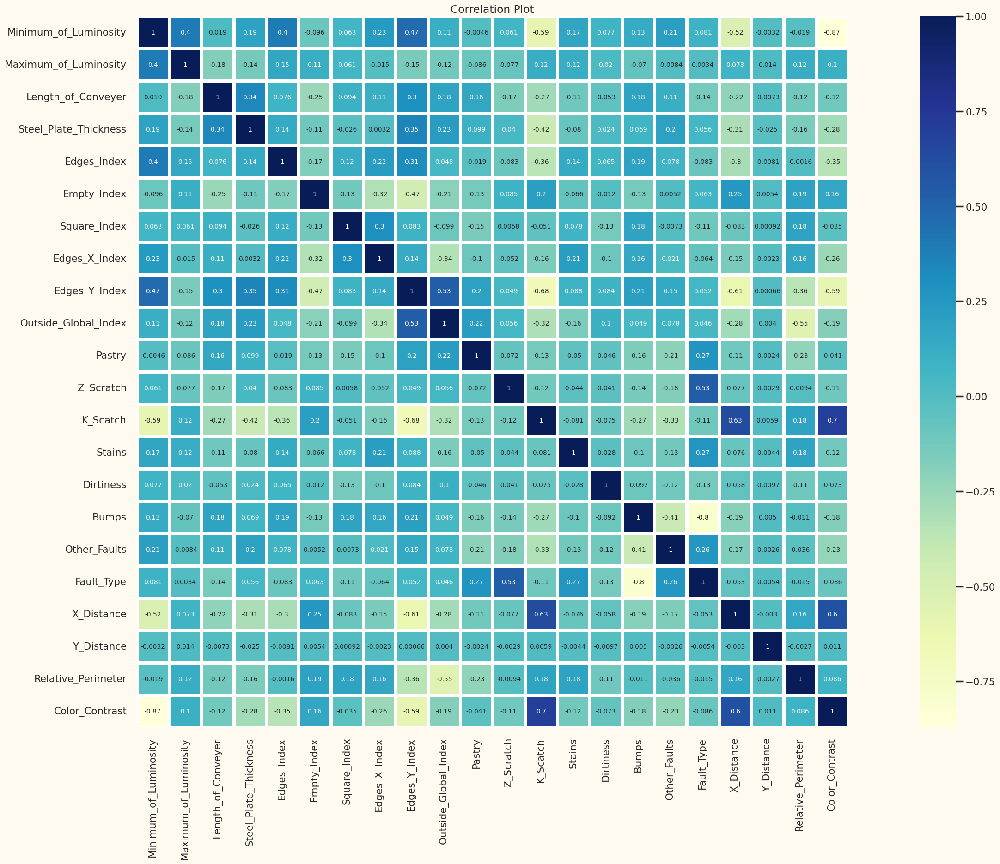

In [33]:
plt.figure(figsize=(40,20))
plt.title("Correlation Plot")
sns.heatmap(train_df.corr(),linewidths=5, annot=True, square=True,annot_kws={'size': 10},cmap='YlGnBu')

In [34]:
# Calculate the correlation matrix
correlation_matrix = train_df.corr()

# Create a mask to identify the features with a correlation coefficient greater than or equal to 0.75
high_correlation_mask = correlation_matrix >= 0.75

# Identify and list the highly correlated features
highly_correlated_features = []

for feature in high_correlation_mask.columns:
    correlated_with = high_correlation_mask.index[high_correlation_mask[feature]].tolist()
    for correlated_feature in correlated_with:
        if feature != correlated_feature and (correlated_feature, feature) not in highly_correlated_features:
            highly_correlated_features.append((feature, correlated_feature))

# Print the highly correlated features
print("Highly correlated features:")
for feature1, feature2 in highly_correlated_features:
    print(f"{feature1} and {feature2}")


Highly correlated features:


In [35]:
train_df.cov()['Fault_Type']

Minimum_of_Luminosity     3.968449
Maximum_of_Luminosity     0.082743
Length_of_Conveyer      -34.169699
Steel_Plate_Thickness     0.050376
Edges_Index              -0.045392
Empty_Index               0.013382
Square_Index             -0.047021
Edges_X_Index            -0.024433
Edges_Y_Index             0.019554
Outside_Global_Index      0.037631
Pastry                    0.123174
Z_Scratch                 0.216303
K_Scatch                 -0.068703
Stains                    0.077279
Dirtiness                -0.034960
Bumps                    -0.590965
Other_Faults              0.208827
Fault_Type                2.906852
X_Distance               -7.287125
Y_Distance               -0.002870
Relative_Perimeter       -0.000972
Color_Contrast           -3.885707
Name: Fault_Type, dtype: float64

## <div style="text-align: left; background-color:aliceblue ; font-family: jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Split the Data into Independent and Dependent Variable </div>

In [36]:
y = train_df['Fault_Type']
y1 = train_df['Pastry']
y2 = train_df['Z_Scratch']
y3 = train_df['K_Scatch']
y4 = train_df['Stains']
y5 = train_df['Dirtiness']
y6 = train_df['Bumps']
y7 = train_df['Other_Faults']


In [37]:
x = train_df.drop(['Pastry', 'Z_Scratch', 'K_Scatch', 'Stains', 'Dirtiness', 'Bumps', 'Other_Faults','Fault_Type'],axis = 1)

#### Computing Class Weights

In [38]:
'''from sklearn.utils.class_weight import compute_class_weight
# Convert y to a NumPy array if it's not already one
arr = np.array(y)

# Calculate unique classes in y
unique_classes = np.unique(arr)

# Convert unique_classes to a list to ensure hashability
unique_classes_list = list(unique_classes)

# Calculate class weights based on the training data
class_weights = compute_class_weight('balanced', 
                                     classes=unique_classes_list,
                                     y=y)

# Create a dictionary of class weights
class_weights_dict = dict(zip(unique_classes_list, class_weights))
print(class_weights_dict)
'''

"from sklearn.utils.class_weight import compute_class_weight\n# Convert y to a NumPy array if it's not already one\narr = np.array(y)\n\n# Calculate unique classes in y\nunique_classes = np.unique(arr)\n\n# Convert unique_classes to a list to ensure hashability\nunique_classes_list = list(unique_classes)\n\n# Calculate class weights based on the training data\nclass_weights = compute_class_weight('balanced', \n                                     classes=unique_classes_list,\n                                     y=y)\n\n# Create a dictionary of class weights\nclass_weights_dict = dict(zip(unique_classes_list, class_weights))\nprint(class_weights_dict)\n"

In [39]:
class_weights_dict = {0: 0.5766795691181325, 1: 5.660972017673049, 2: 0.8002248407378107, 3: 0.4198121450415028, 4: 1.2020890668001, 5: 4.833752515090543, 6: 2.3874534161490684}

In [40]:
x.shape

(19219, 14)

In [41]:
test_df.shape

(12814, 14)

## <div style="text-align: left; background-color:aliceblue ; font-family: Jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Feature Scaling </div>

In [42]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
scaler = RobustScaler()
standardscl = StandardScaler()
minmax = MinMaxScaler()

In [43]:
x_scaled = scaler.fit_transform(x)

In [44]:
test_df_scaled = scaler.transform(test_df)

## <div style="text-align: left; background-color:aliceblue ; font-family: jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Split the Data into Training and Test </div>

## <div style="text-align: left; background-color:aliceblue ; font-family: jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Split the Data into Training and Test (UnScaled) </div>

In [45]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

## <div style="text-align: left; background-color:aliceblue ; font-family: jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Split the Data into Training and Test (scaled) </div>

In [46]:
x_train_scaled, x_test_scaled, y_train, y_test = train_test_split(x_scaled, y, test_size=0.2, random_state=42)

## <div style="text-align: left; background-color:aliceblue ; font-family: jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> PCA Implementation </div>

In [47]:
from sklearn.decomposition import PCA

In [48]:
x_train_scaled.shape

(15375, 14)

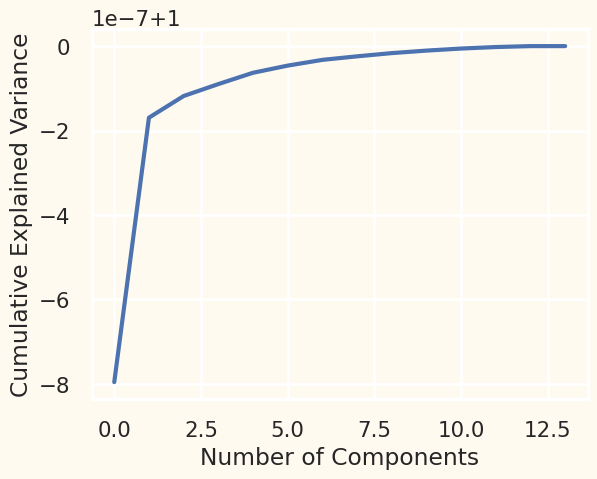

In [49]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA()
pca.fit(x_scaled)  # X_train is your training data
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance_ratio = explained_variance_ratio.cumsum()

plt.plot(cumulative_variance_ratio)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

In [50]:
## PCA- Transformation
#pca=PCA(n_components=20)
#pca

In [51]:
#Scaled Data
#x_scaled=pca.fit_transform(x_scaled)

In [52]:
#x_train1 = pca.transform(x_train1)

In [53]:
#Scaled data
#test_df_scaled=pca.transform(test_df_scaled)

In [54]:
#x_test1 = pca.transform(x_test1)

In [55]:
# Machine learning algorithms
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier,VotingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier,Pool
import tensorflow
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense,BatchNormalization,Dropout
import os
from sklearn.base import ClassifierMixin
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.multiclass import OneVsRestClassifier
#from scikeras.wrappers import KerasClassifier


#for hypertuning
import optuna
from collections import Counter
from catboost import CatBoostError
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV,RepeatedStratifiedKFold

# for model evaluation
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import balanced_accuracy_score # for Gini-mean
from sklearn.metrics import roc_curve,auc

2024-03-22 19:38:06.249122: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-22 19:38:06.249273: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-22 19:38:06.435208: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## <div style="text-align: left; background-color:aliceblue ; font-family: jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Baseline Model Building </div>

In [56]:
def model_prediction(model, x, y, n_splits=5, random_state=42):
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)

    training_score = []
    testing_score = []
    precission = []
    recall = []
    f1_score_ = []
    roc_auc_scores = []  # List to store AUC-ROC scores

    x = pd.DataFrame(x)  # Convert x to DataFrame

    for train_index, test_index in skf.split(x, y):
        x_train, x_test = x.iloc[train_index], x.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        model.fit(x_train, y_train)
        x_train_pred = model.predict(x_train)
        x_test_pred = model.predict(x_test)

        a = accuracy_score(y_train, x_train_pred) * 100
        b = accuracy_score(y_test, x_test_pred) * 100
        c = precision_score(y_test, x_test_pred, average='weighted') 
        d = recall_score(y_test, x_test_pred, average='weighted')     
        e = f1_score(y_test, x_test_pred, average='weighted')
        
        # Calculate AUC-ROC score
        roc_auc = roc_auc_score(y_test, model.predict_proba(x_test)[:,1])
        roc_auc_scores.append(roc_auc)

        training_score.append(a)
        testing_score.append(b)
        precission.append(c)
        recall.append(d)
        f1_score_.append(e)

    print("\n------------------------------------------------------------------------")
    print(f"Mean Accuracy_Score of {model} model on Training Data is:", np.mean(training_score))
    print(f"Mean Accuracy_Score of {model} model on Testing Data is:", np.mean(testing_score))
    print(f"Mean Precision Score of {model} model is:", np.mean(precission))
    print(f"Mean Recall Score of {model} model is:", np.mean(recall))
    print(f"Mean f1 Score of {model} model is:", np.mean(f1_score_))
    print(f"Mean AUC-ROC Score of {model} model is:", np.mean(roc_auc_scores))

    print("\n------------------------------------------------------------------------")
    print(f"Classification Report of {model} model is:")
    y_pred_all = cross_val_predict(model, x, y, cv=skf)
    print(classification_report(y, y_pred_all))

    print("\n------------------------------------------------------------------------")
    print(f"Plotting ROC-AUC curve for {model} model:")
    
    # Plot ROC-AUC curve
    mean_fpr = np.linspace(0, 1, 100)
    tprs = []

    for train_index, test_index in skf.split(x, y):
        x_train, x_test = x.iloc[train_index], x.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        probas_ = model.fit(x_train, y_train).predict_proba(x_test)
        fpr, tpr, thresholds = roc_curve(y_test, probas_[:, 1])
        tprs.append(np.interp(mean_fpr, fpr, tpr))

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)

    plt.plot(mean_fpr, mean_tpr, color='b', label=f'Mean ROC (AUC = {mean_auc:.2f})')
    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r', label='Chance', alpha=.8)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC-AUC Curve for {model} Model')
    plt.legend(loc='lower right')
    plt.show()


## <div style="text-align: left; background-color:aliceblue ; font-family: jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Model Building for scaled data</div>

## <div style="text-align: left; background-color:aliceblue ; font-family: jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Logistic Regression</div>


------------------------------------------------------------------------
Mean Accuracy_Score of LogisticRegression() model on Training Data is: 92.09376462526332
Mean Accuracy_Score of LogisticRegression() model on Testing Data is: 92.1535973754462
Mean Precision Score of LogisticRegression() model is: 0.8831479518923743
Mean Recall Score of LogisticRegression() model is: 0.9215359737544621
Mean f1 Score of LogisticRegression() model is: 0.8911830462148428
Mean AUC-ROC Score of LogisticRegression() model is: 0.836711205421081

------------------------------------------------------------------------
Classification Report of LogisticRegression() model is:
              precision    recall  f1-score   support

           0       0.93      0.99      0.96     17753
           1       0.37      0.04      0.07      1466

    accuracy                           0.92     19219
   macro avg       0.65      0.52      0.51     19219
weighted avg       0.88      0.92      0.89     19219


---------

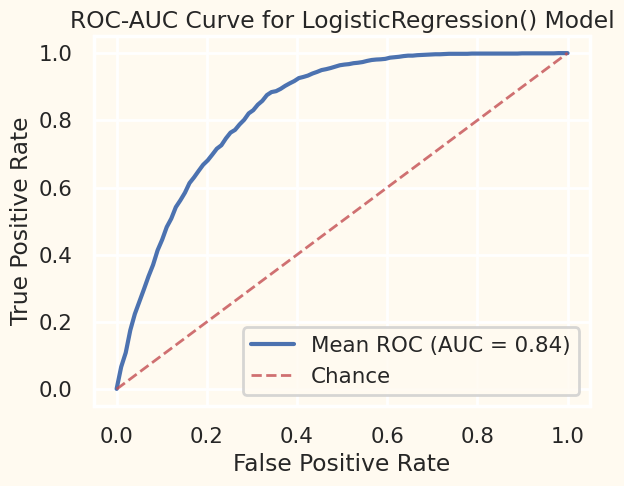

In [57]:
model_prediction(LogisticRegression(), x_scaled, y1, n_splits=5, random_state=42)


------------------------------------------------------------------------
Mean Accuracy_Score of LogisticRegression() model on Training Data is: 93.9447937869597
Mean Accuracy_Score of LogisticRegression() model on Testing Data is: 93.99032336588843
Mean Precision Score of LogisticRegression() model is: 0.9016259834598935
Mean Recall Score of LogisticRegression() model is: 0.9399032336588844
Mean f1 Score of LogisticRegression() model is: 0.9122106072057843
Mean AUC-ROC Score of LogisticRegression() model is: 0.8399781012763509

------------------------------------------------------------------------
Classification Report of LogisticRegression() model is:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97     18069
           1       0.41      0.01      0.02      1150

    accuracy                           0.94     19219
   macro avg       0.68      0.50      0.49     19219
weighted avg       0.91      0.94      0.91     19219


--------

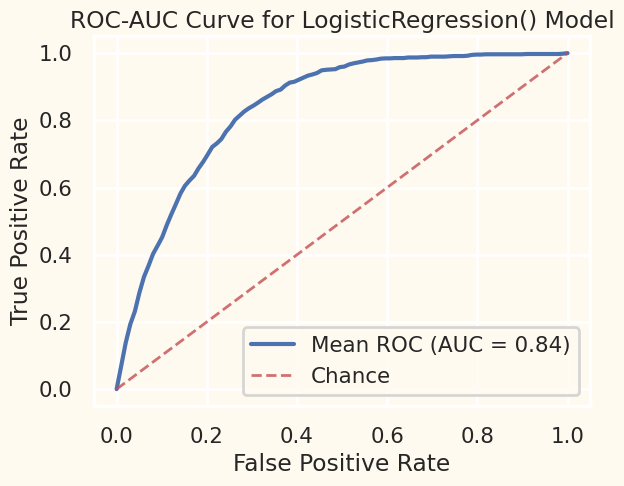

In [58]:
model_prediction(LogisticRegression(), x_scaled, y2, n_splits=5, random_state=42)


------------------------------------------------------------------------
Mean Accuracy_Score of LogisticRegression() model on Training Data is: 95.64102924629663
Mean Accuracy_Score of LogisticRegression() model on Testing Data is: 95.56166556055675
Mean Precision Score of LogisticRegression() model is: 0.9552240782249857
Mean Recall Score of LogisticRegression() model is: 0.9556166556055675
Mean f1 Score of LogisticRegression() model is: 0.9553440633134516
Mean AUC-ROC Score of LogisticRegression() model is: 0.9669251511452085

------------------------------------------------------------------------
Classification Report of LogisticRegression() model is:
              precision    recall  f1-score   support

           0       0.97      0.98      0.97     15787
           1       0.89      0.86      0.87      3432

    accuracy                           0.96     19219
   macro avg       0.93      0.92      0.92     19219
weighted avg       0.96      0.96      0.96     19219


-------

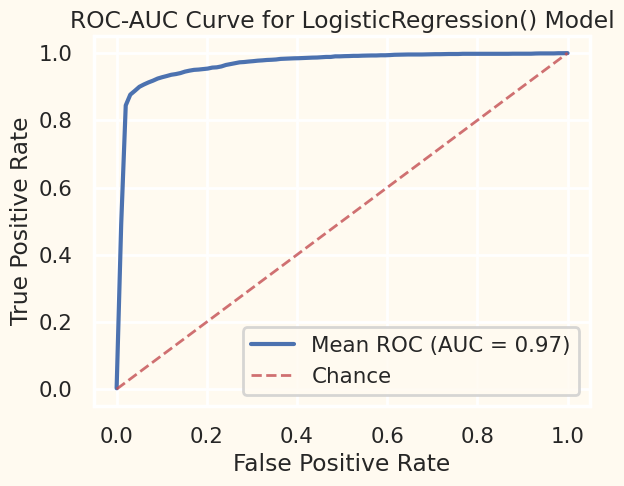

In [59]:
model_prediction(LogisticRegression(), x_scaled, y3, n_splits=5, random_state=42)


------------------------------------------------------------------------
Mean Accuracy_Score of LogisticRegression() model on Training Data is: 96.97694720100165
Mean Accuracy_Score of LogisticRegression() model on Testing Data is: 96.8728999819394
Mean Precision Score of LogisticRegression() model is: 0.9573984664825972
Mean Recall Score of LogisticRegression() model is: 0.968728999819394
Mean f1 Score of LogisticRegression() model is: 0.960951641374631
Mean AUC-ROC Score of LogisticRegression() model is: 0.9523108604040832

------------------------------------------------------------------------
Classification Report of LogisticRegression() model is:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98     18651
           1       0.42      0.14      0.21       568

    accuracy                           0.97     19219
   macro avg       0.70      0.57      0.60     19219
weighted avg       0.96      0.97      0.96     19219


----------

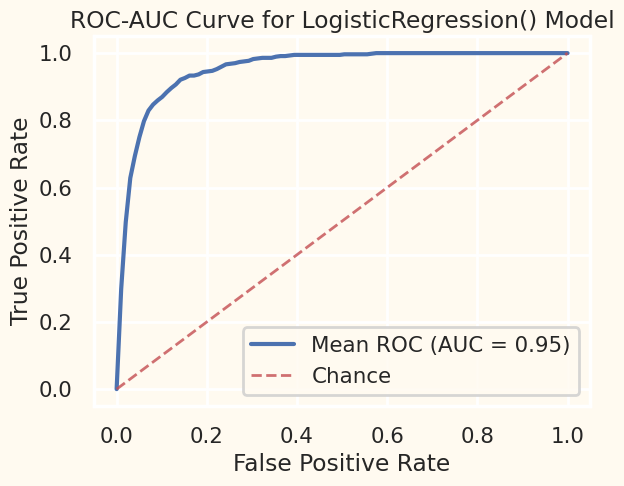

In [60]:
model_prediction(LogisticRegression(), x_scaled, y4, n_splits=5, random_state=42)


------------------------------------------------------------------------
Mean Accuracy_Score of LogisticRegression() model on Training Data is: 97.47515477610551
Mean Accuracy_Score of LogisticRegression() model on Testing Data is: 97.47125264985758
Mean Precision Score of LogisticRegression() model is: 0.9501646588160684
Mean Recall Score of LogisticRegression() model is: 0.9747125264985759
Mean f1 Score of LogisticRegression() model is: 0.9622820611192553
Mean AUC-ROC Score of LogisticRegression() model is: 0.8257939923785653

------------------------------------------------------------------------
Classification Report of LogisticRegression() model is:
              precision    recall  f1-score   support

           0       0.97      1.00      0.99     18734
           1       0.00      0.00      0.00       485

    accuracy                           0.97     19219
   macro avg       0.49      0.50      0.49     19219
weighted avg       0.95      0.97      0.96     19219


-------

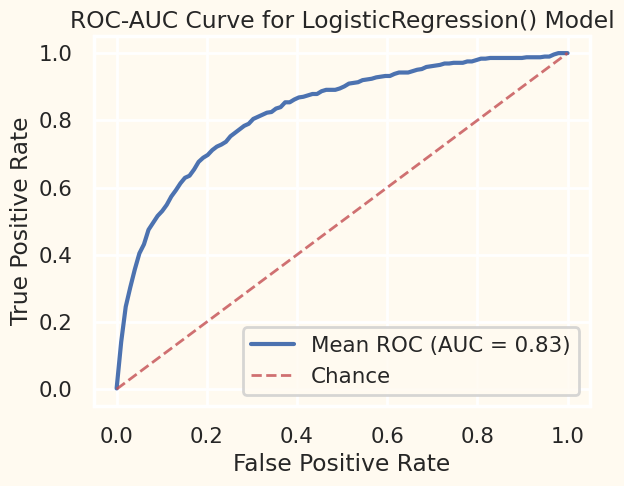

In [61]:
model_prediction(LogisticRegression(), x_scaled, y5, n_splits=5, random_state=42)


------------------------------------------------------------------------
Mean Accuracy_Score of LogisticRegression() model on Training Data is: 75.3642201128567
Mean Accuracy_Score of LogisticRegression() model on Testing Data is: 75.4045356734666
Mean Precision Score of LogisticRegression() model is: 0.7048792520561511
Mean Recall Score of LogisticRegression() model is: 0.754045356734666
Mean f1 Score of LogisticRegression() model is: 0.6878934984127005
Mean AUC-ROC Score of LogisticRegression() model is: 0.7151494799869971

------------------------------------------------------------------------
Classification Report of LogisticRegression() model is:
              precision    recall  f1-score   support

           0       0.77      0.97      0.86     14456
           1       0.52      0.11      0.18      4763

    accuracy                           0.75     19219
   macro avg       0.64      0.54      0.52     19219
weighted avg       0.71      0.75      0.69     19219


----------

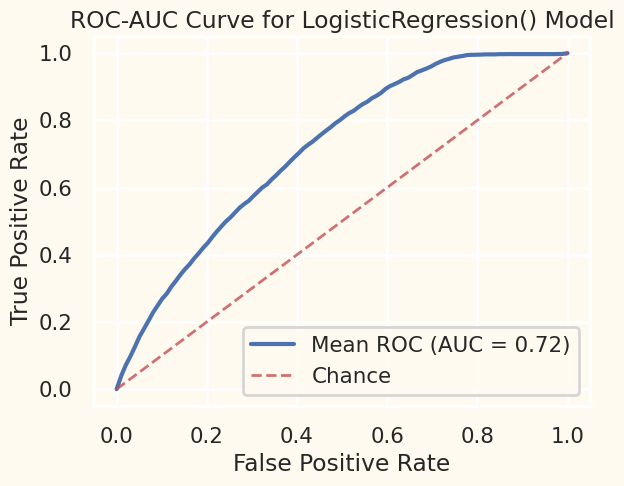

In [62]:
model_prediction(LogisticRegression(), x_scaled, y6, n_splits=5, random_state=42)


------------------------------------------------------------------------
Mean Accuracy_Score of LogisticRegression() model on Training Data is: 67.11717460639747
Mean Accuracy_Score of LogisticRegression() model on Testing Data is: 67.10543353145833
Mean Precision Score of LogisticRegression() model is: 0.6416023408131777
Mean Recall Score of LogisticRegression() model is: 0.6710543353145834
Mean f1 Score of LogisticRegression() model is: 0.6105607922313531
Mean AUC-ROC Score of LogisticRegression() model is: 0.6552142085888985

------------------------------------------------------------------------
Classification Report of LogisticRegression() model is:
              precision    recall  f1-score   support

           0       0.68      0.93      0.79     12661
           1       0.56      0.18      0.27      6558

    accuracy                           0.67     19219
   macro avg       0.62      0.55      0.53     19219
weighted avg       0.64      0.67      0.61     19219


-------

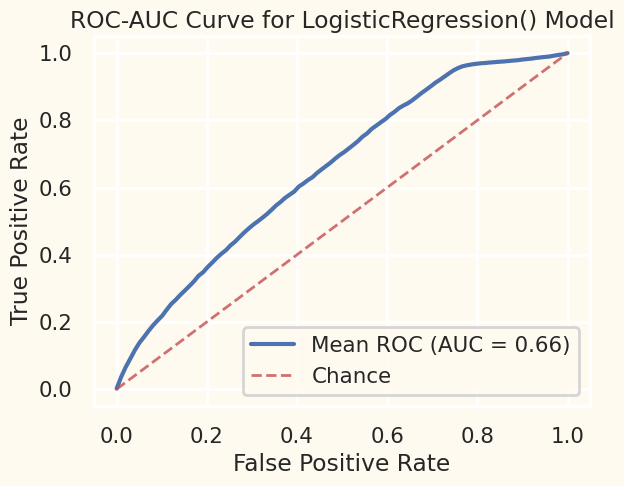

In [63]:
model_prediction(LogisticRegression(), x_scaled, y7, n_splits=5, random_state=42)

## <div style="text-align: left; background-color:aliceblue ; font-family: jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Model Building for Unscaled Data </div>

## <div style="text-align: left; background-color:aliceblue ; font-family: jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> XGBOOST </div>

In [64]:
'''def objective(trial):
    max_depth = trial.suggest_int('max_depth', 3, 10)
    n_estimators = trial.suggest_int('n_estimators', 100, 2000)
    gamma = trial.suggest_float('gamma', 0, 1)
    reg_alpha = trial.suggest_float('reg_alpha', 0, 2)
    reg_lambda = trial.suggest_float('reg_lambda', 0, 2)
    min_child_weight = trial.suggest_int('min_child_weight', 0, 10)
    subsample = trial.suggest_float('subsample', 0, 1)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0, 1)
    learning_rate = trial.suggest_float('learning_rate', 0.01, 1)
    
    print('Training the model with', x.shape[1], 'features')
    
    params = {'n_estimators': n_estimators,
              'learning_rate': learning_rate,
              'gamma': gamma,
              'reg_alpha': reg_alpha,
              'reg_lambda': reg_lambda,
              'max_depth': max_depth,
              'min_child_weight': min_child_weight,
              'subsample': subsample,
              'colsample_bytree': colsample_bytree,
              'eval_metric':'logloss'}  # Using logloss for binary classification
        
    clf = XGBClassifier(**params,
                        booster='gbtree',
                        objective='binary:logistic',  # Binary classification objective
                        verbosity=0)
    
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    cv_results = cross_val_score(clf, x, y7, cv=cv, scoring='roc_auc')  # Using roc_auc scoring
    
    validation_score = np.mean(cv_results)
    
    return validation_score
'''

"def objective(trial):\n    max_depth = trial.suggest_int('max_depth', 3, 10)\n    n_estimators = trial.suggest_int('n_estimators', 100, 2000)\n    gamma = trial.suggest_float('gamma', 0, 1)\n    reg_alpha = trial.suggest_float('reg_alpha', 0, 2)\n    reg_lambda = trial.suggest_float('reg_lambda', 0, 2)\n    min_child_weight = trial.suggest_int('min_child_weight', 0, 10)\n    subsample = trial.suggest_float('subsample', 0, 1)\n    colsample_bytree = trial.suggest_float('colsample_bytree', 0, 1)\n    learning_rate = trial.suggest_float('learning_rate', 0.01, 1)\n    \n    print('Training the model with', x.shape[1], 'features')\n    \n    params = {'n_estimators': n_estimators,\n              'learning_rate': learning_rate,\n              'gamma': gamma,\n              'reg_alpha': reg_alpha,\n              'reg_lambda': reg_lambda,\n              'max_depth': max_depth,\n              'min_child_weight': min_child_weight,\n              'subsample': subsample,\n              'colsample

In [65]:
#study = optuna.create_study(direction="maximize")
#study.optimize(objective, n_trials=25)

In [66]:
#best_params = study.best_params
#print("Best Hyperparameters:", best_params)

In [67]:
xgb_best_params_for_y1 = {'max_depth': 10, 'n_estimators': 183, 'gamma': 0.2906258680984795, 'reg_alpha': 1.9697719072940765, 'reg_lambda': 1.583987972389546, 'min_child_weight': 10, 'subsample': 0.9740357236408725, 'colsample_bytree': 0.42741895633525795, 'learning_rate': 0.01889380974278774}

In [68]:
xgb_model_for_y1 = XGBClassifier(**xgb_best_params_for_y1)
xgb_model_for_y1.fit( x, y1)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.42741895633525795, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.2906258680984795,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01889380974278774,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=10, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=183, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

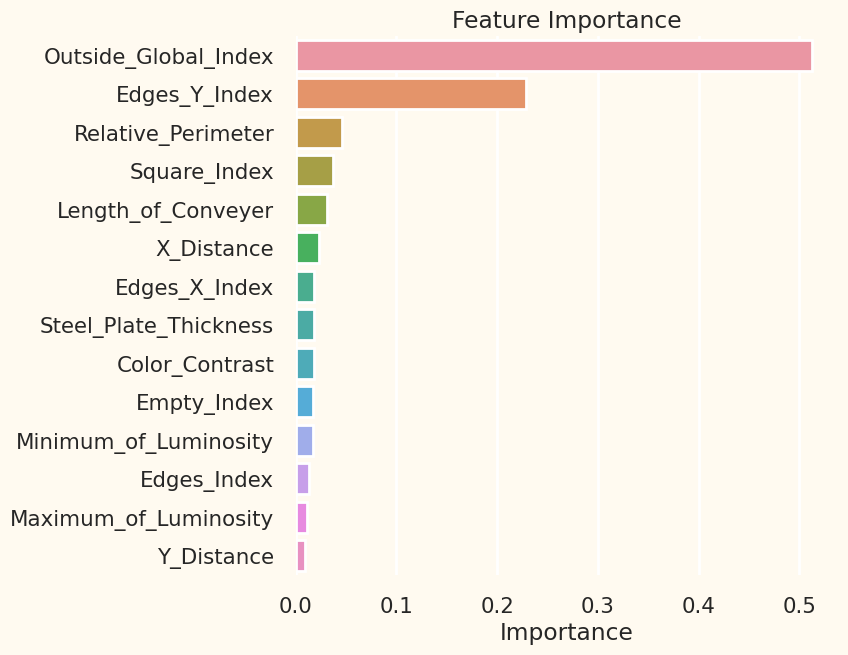

In [69]:
# feature importances
feature_importance = xgb_model_for_y1.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

In [70]:
xgb_best_params_for_y2 ={'max_depth': 10, 'n_estimators': 363, 'gamma': 0.6340041422945999, 'reg_alpha': 1.7140056365764496, 'reg_lambda': 0.5384452305062735, 'min_child_weight': 4, 'subsample': 0.9924510565901757, 'colsample_bytree': 0.10862617637568875, 'learning_rate': 0.4510568243088729}

In [71]:
xgb_model_for_y2 = XGBClassifier(**xgb_best_params_for_y2)
xgb_model_for_y2.fit( x, y2)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.10862617637568875, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.6340041422945999,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.4510568243088729,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=4, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=363, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

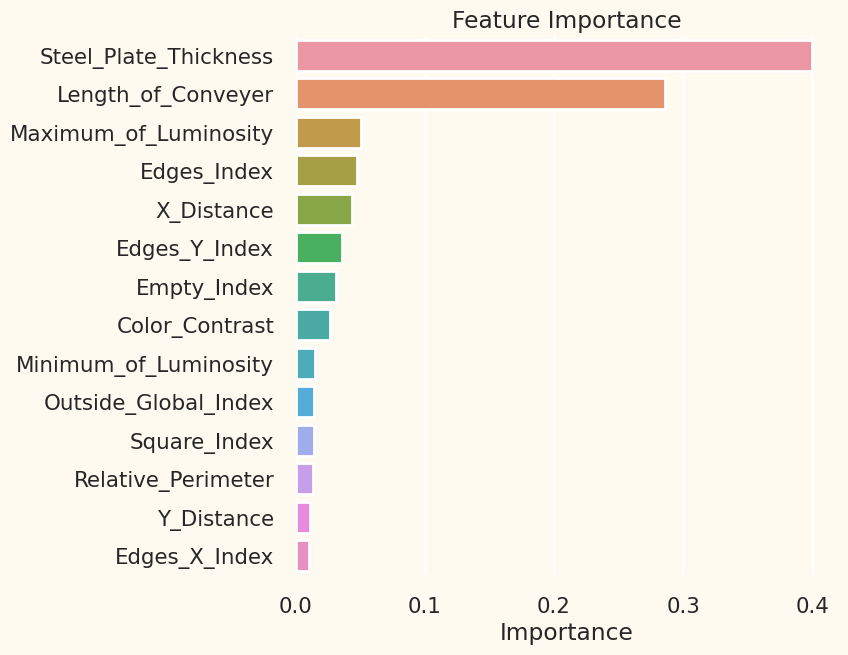

In [72]:
# feature importances
feature_importance = xgb_model_for_y2.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

In [73]:
xgb_best_params_for_y3 = {'max_depth': 8, 'n_estimators': 305, 'gamma': 0.9803945252147186, 'reg_alpha': 0.8816242648099404, 'reg_lambda': 1.5924318422711692, 'min_child_weight': 5, 'subsample': 0.38884665890556397, 'colsample_bytree': 0.6146785948823625, 'learning_rate': 0.014546460171800304}

In [74]:
xgb_model_for_y3 = XGBClassifier(**xgb_best_params_for_y3)
xgb_model_for_y3.fit( x, y3)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6146785948823625, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.9803945252147186,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.014546460171800304,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=5, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=305, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

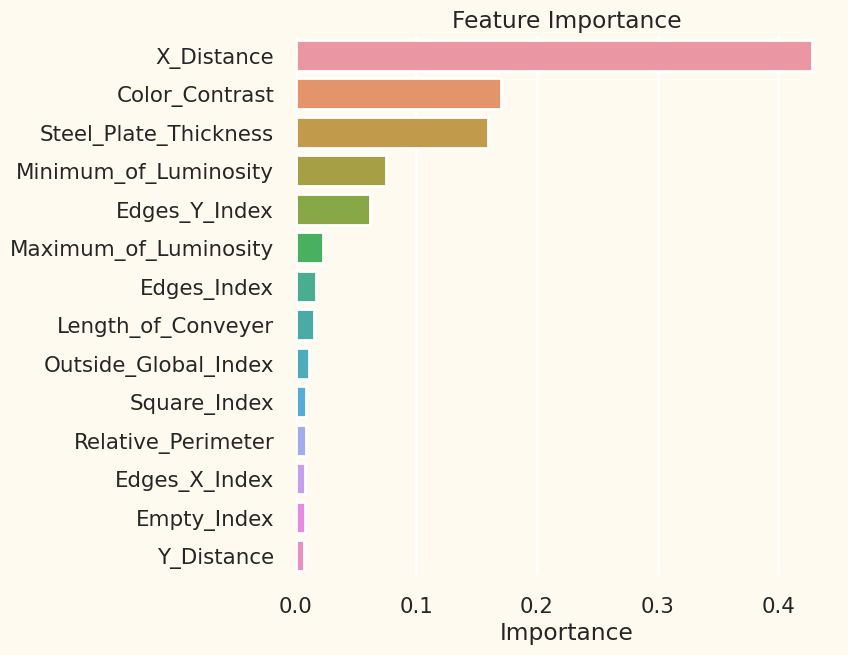

In [75]:
# feature importances
feature_importance = xgb_model_for_y3.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

In [76]:
xgb_best_params_for_y4 = {'max_depth': 8, 'n_estimators': 441, 'gamma': 0.20387774287368832, 'reg_alpha': 1.6721534287562028, 'reg_lambda': 1.5854803769735155, 'min_child_weight': 10, 'subsample': 0.5698125518971715, 'colsample_bytree': 0.20531257748426304, 'learning_rate': 0.01728285922719075}

In [77]:
xgb_model_for_y4 = XGBClassifier(**xgb_best_params_for_y4)
xgb_model_for_y4.fit( x, y4)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.20531257748426304, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.20387774287368832,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01728285922719075,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=10, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=441, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

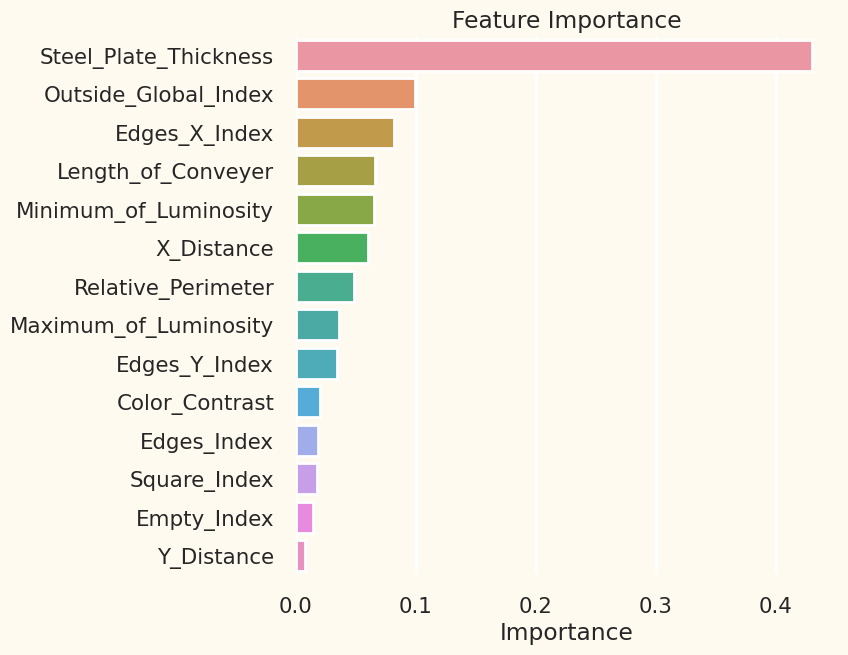

In [78]:
# feature importances
feature_importance = xgb_model_for_y4.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

In [79]:
xgb_best_params_for_y5 = {'max_depth': 6, 'n_estimators': 1535, 'gamma': 0.9877484911226693, 'reg_alpha': 1.1572405645575905, 'reg_lambda': 0.5372427694283166, 'min_child_weight': 8, 'subsample': 0.6356358873220314, 'colsample_bytree': 0.036681272400460915, 'learning_rate': 0.010141192165225743}

In [80]:
xgb_model_for_y5 = XGBClassifier(**xgb_best_params_for_y5)
xgb_model_for_y5.fit( x, y5)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.036681272400460915, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.9877484911226693,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.010141192165225743,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=8, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=1535, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

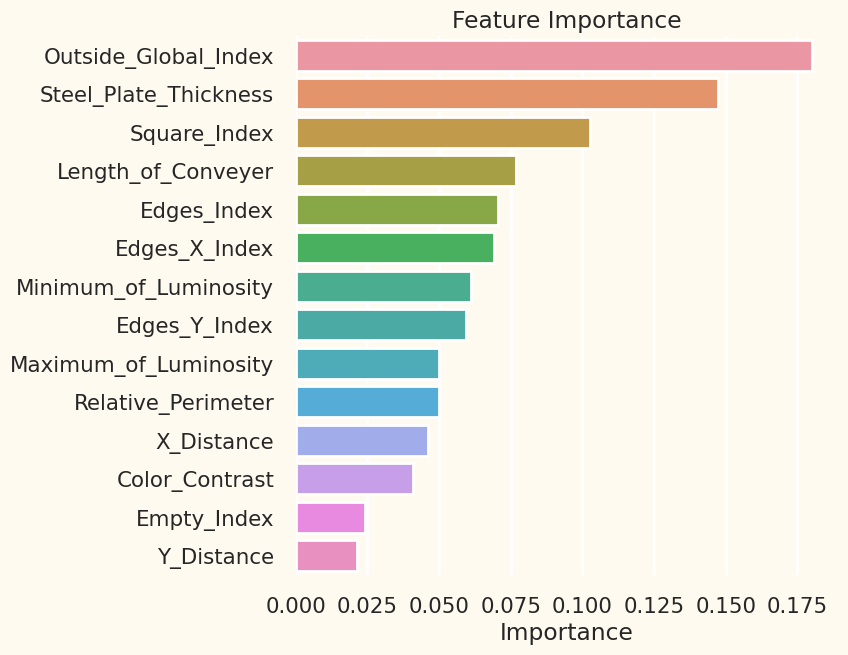

In [81]:
# feature importances
feature_importance = xgb_model_for_y5.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

In [82]:
xgb_best_params_for_y6 = {'max_depth': 10, 'n_estimators': 1208, 'gamma': 0.894147925868849, 'reg_alpha': 1.8400678413946112, 'reg_lambda': 1.7395249370925037, 'min_child_weight': 6, 'subsample': 0.9882579056463536, 'colsample_bytree': 0.15505599178897211, 'learning_rate': 0.12366078747125031}

In [83]:
xgb_model_for_y6 = XGBClassifier(**xgb_best_params_for_y6)
xgb_model_for_y6.fit( x, y6)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.15505599178897211, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.894147925868849,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.12366078747125031,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=6, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=1208, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

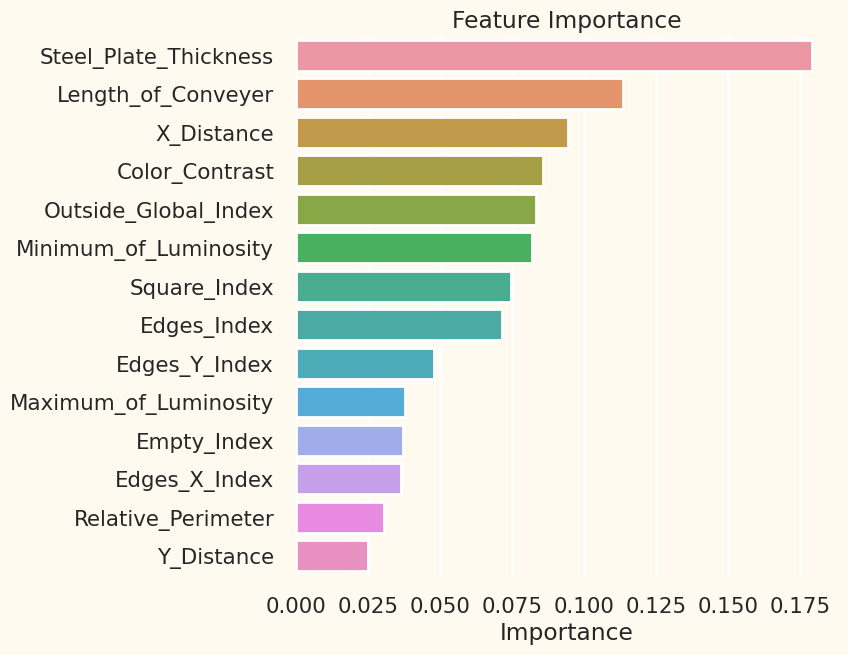

In [84]:
# feature importances
feature_importance = xgb_model_for_y6.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

In [85]:
xgb_best_params_for_y7 = {'max_depth': 8, 'n_estimators': 157, 'gamma': 0.030974323363716277, 'reg_alpha': 1.3795701279072203, 'reg_lambda': 1.9982402829667187, 'min_child_weight': 0, 'subsample': 0.5874286324268942, 'colsample_bytree': 0.9775133010466053, 'learning_rate': 0.013254283777650415}

In [86]:
xgb_model_for_y7 = XGBClassifier(**xgb_best_params_for_y7)
xgb_model_for_y7.fit( x, y7)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9775133010466053, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.030974323363716277,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.013254283777650415,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=0, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=157, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

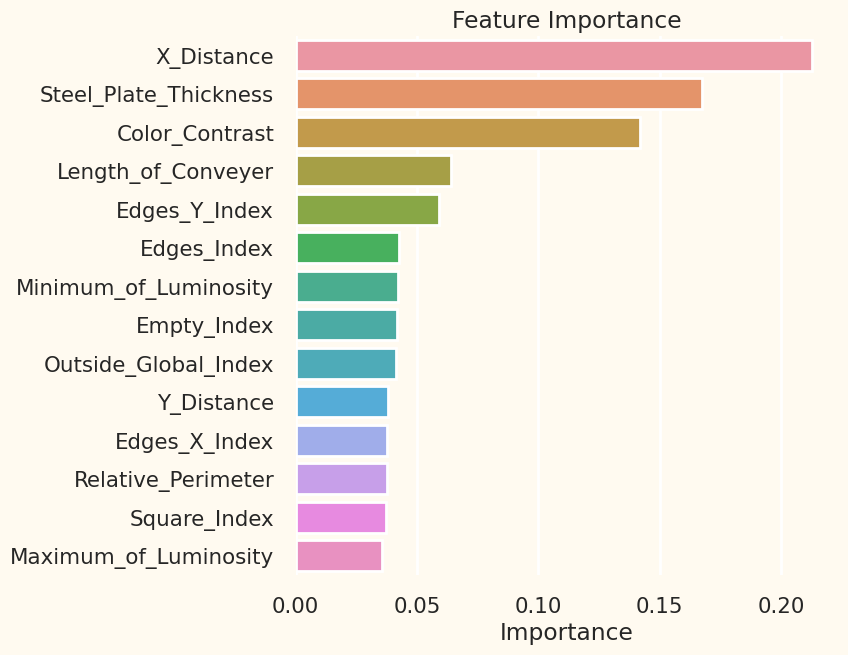

In [87]:
# feature importances
feature_importance = xgb_model_for_y7.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

## <div style="text-align: left; background-color:aliceblue ; font-family: jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Checking XGBOOST performance </div>


------------------------------------------------------------------------
Mean Accuracy_Score of XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.42741895633525795, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.2906258680984795,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01889380974278774,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=10, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=183, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...) model on Training Data is: 92.74676091131359
Mean Accuracy_Score of XGBClassifier(base_score

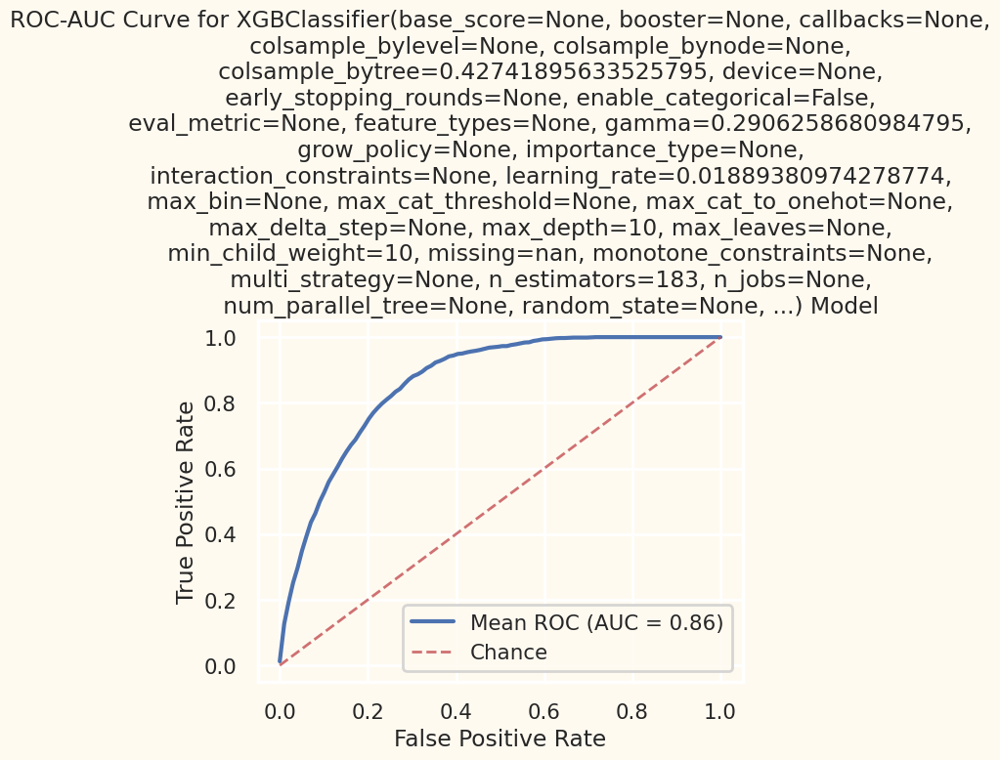

In [88]:
model_prediction(XGBClassifier(**xgb_best_params_for_y1), x, y1, n_splits=5, random_state=42)


------------------------------------------------------------------------
Mean Accuracy_Score of XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.10862617637568875, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.6340041422945999,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.4510568243088729,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=4, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=363, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...) model on Training Data is: 96.17305643680787
Mean Accuracy_Score of XGBClassifier(base_score=N

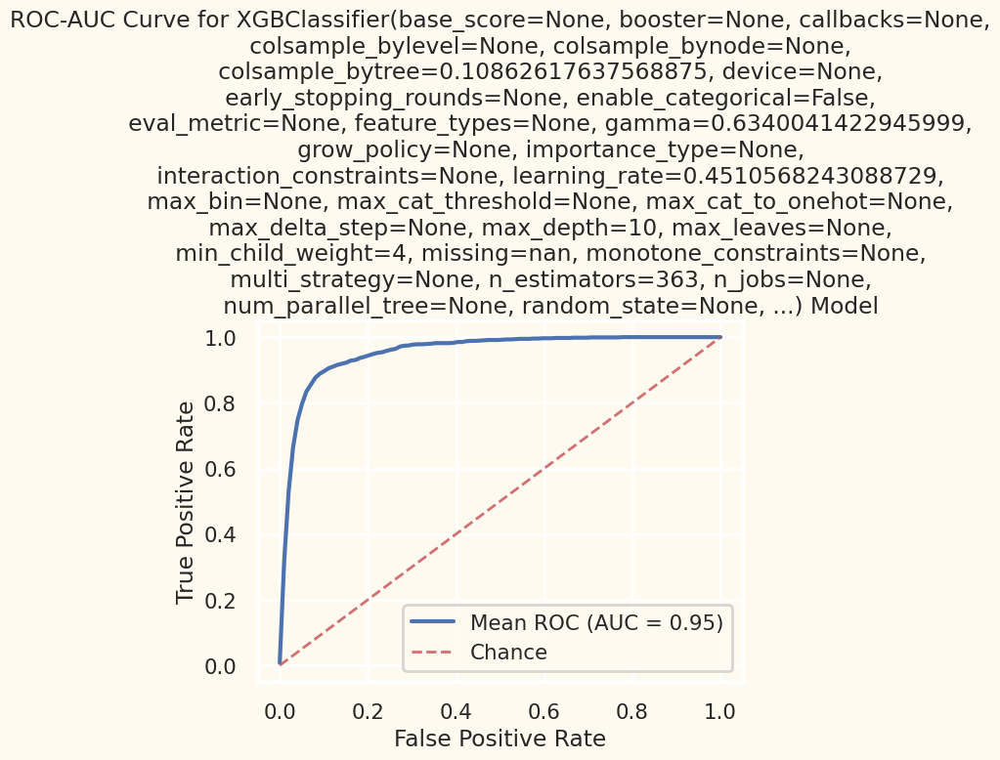

In [89]:
model_prediction(XGBClassifier(**xgb_best_params_for_y2), x, y2, n_splits=5, random_state=42)


------------------------------------------------------------------------
Mean Accuracy_Score of XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6146785948823625, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.9803945252147186,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.014546460171800304,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=5, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=305, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...) model on Training Data is: 96.55158819996107
Mean Accuracy_Score of XGBClassifier(base_score=N

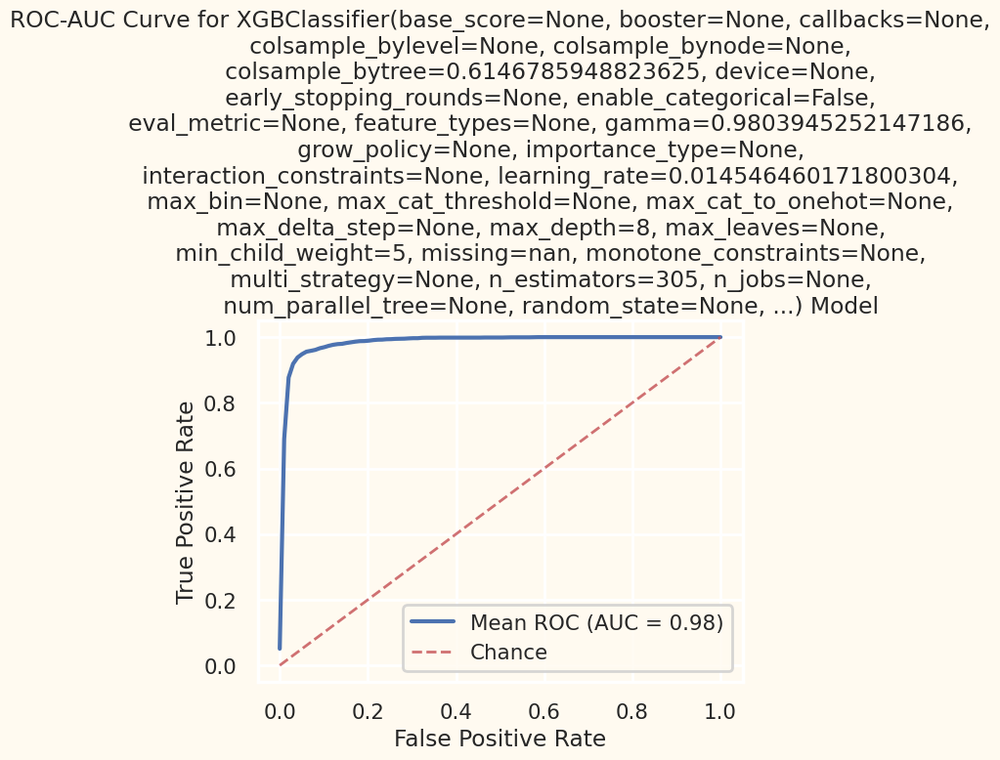

In [90]:
model_prediction(XGBClassifier(**xgb_best_params_for_y3), x, y3, n_splits=5, random_state=42)


------------------------------------------------------------------------
Mean Accuracy_Score of XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.20531257748426304, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.20387774287368832,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01728285922719075,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=10, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=441, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...) model on Training Data is: 98.54310812754329
Mean Accuracy_Score of XGBClassifier(base_score

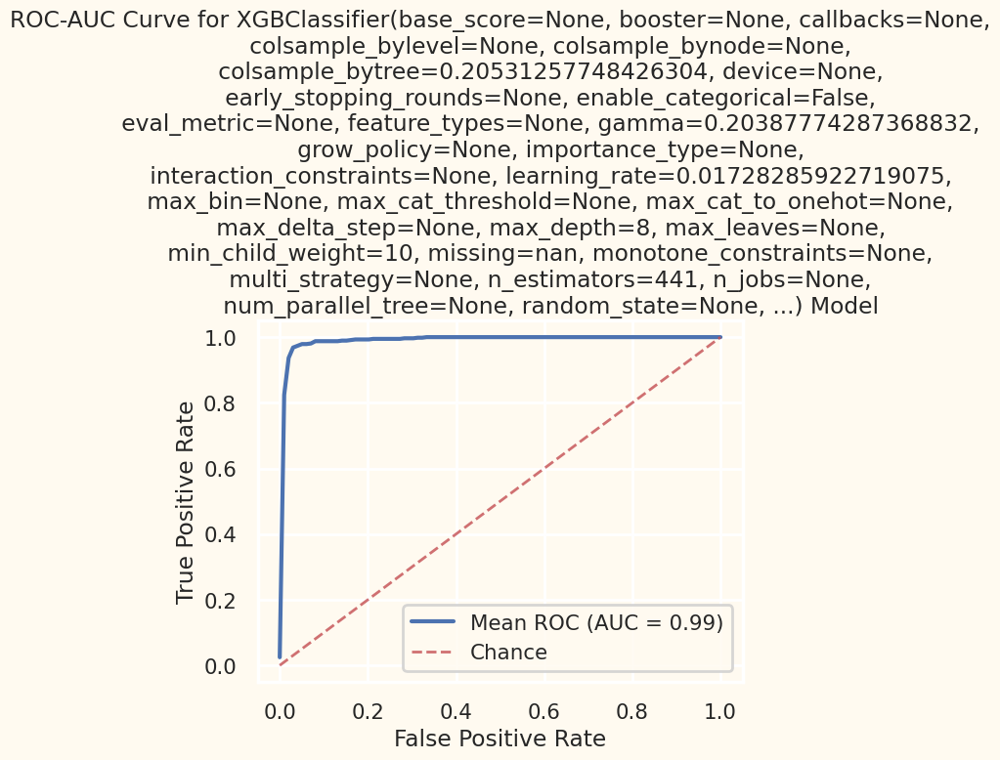

In [91]:
model_prediction(XGBClassifier(**xgb_best_params_for_y4), x, y4, n_splits=5, random_state=42)


------------------------------------------------------------------------
Mean Accuracy_Score of XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.036681272400460915, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.9877484911226693,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.010141192165225743,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=8, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=1535, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...) model on Training Data is: 97.63515308410108
Mean Accuracy_Score of XGBClassifier(base_scor

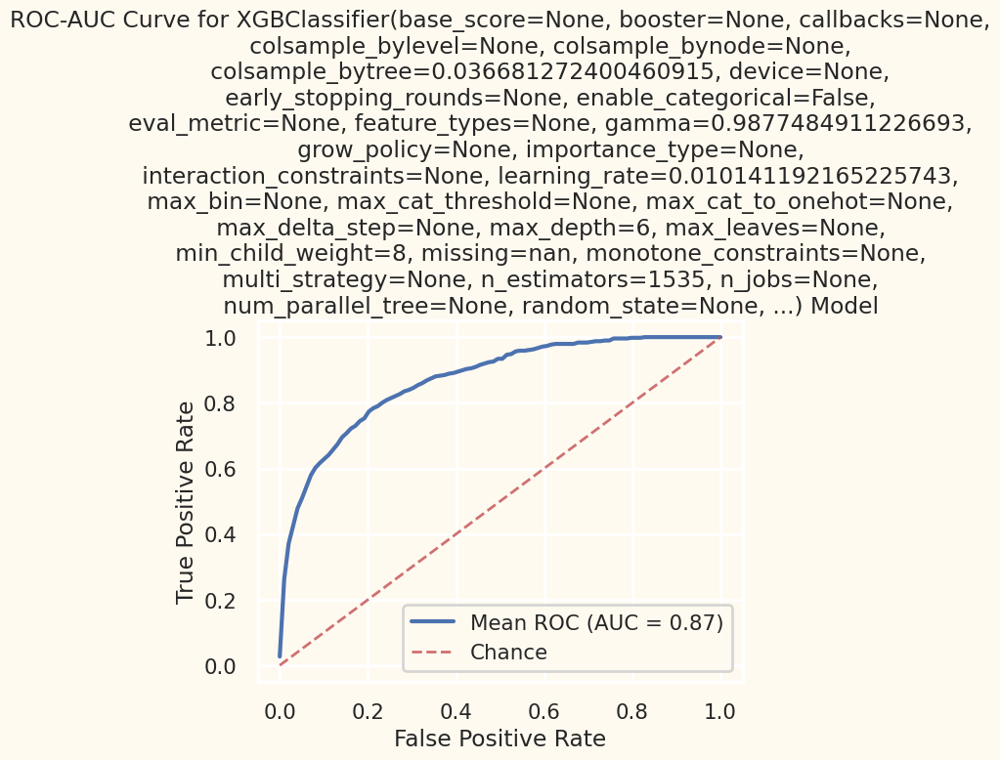

In [92]:
model_prediction(XGBClassifier(**xgb_best_params_for_y5), x, y5, n_splits=5, random_state=42)


------------------------------------------------------------------------
Mean Accuracy_Score of XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.15505599178897211, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.894147925868849,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.12366078747125031,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=6, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=1208, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...) model on Training Data is: 82.3377889732071
Mean Accuracy_Score of XGBClassifier(base_score=N

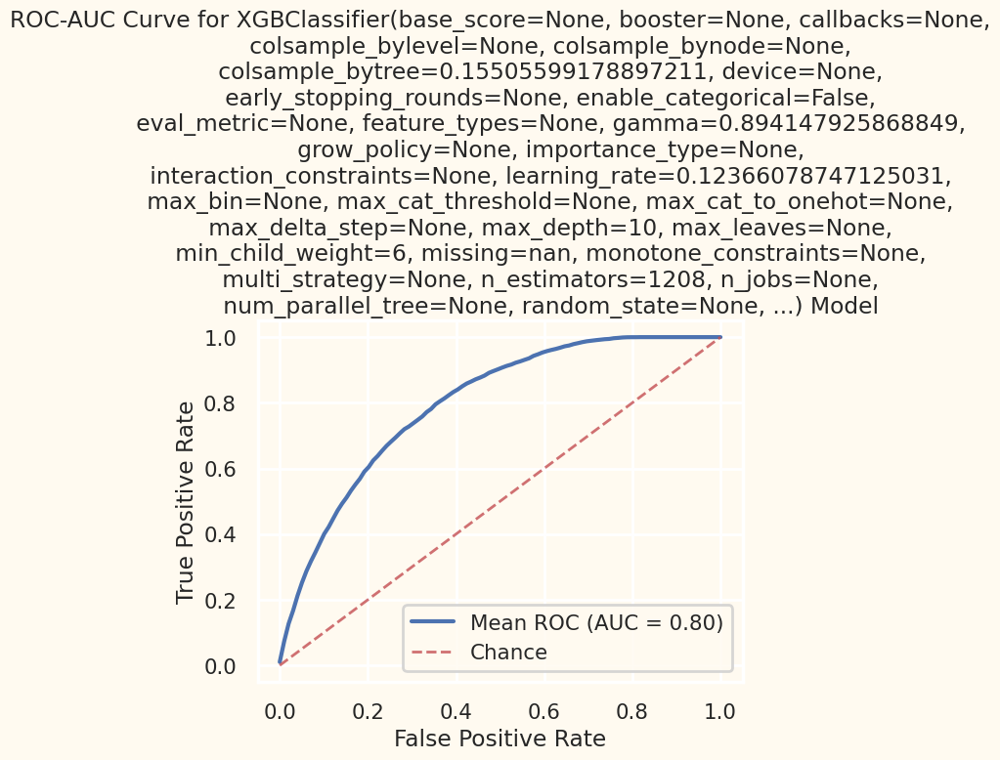

In [93]:
model_prediction(XGBClassifier(**xgb_best_params_for_y6), x, y6, n_splits=5, random_state=42)


------------------------------------------------------------------------
Mean Accuracy_Score of XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9775133010466053, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.030974323363716277,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.013254283777650415,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=0, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=157, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...) model on Training Data is: 73.41953309137669
Mean Accuracy_Score of XGBClassifier(base_score

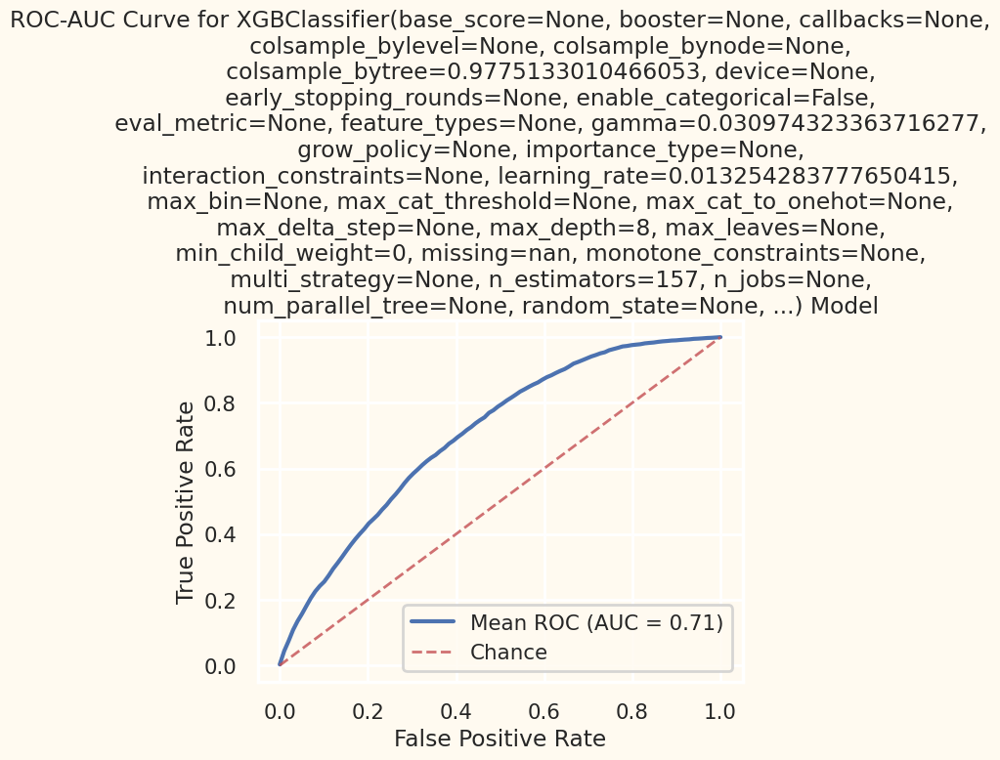

In [94]:
model_prediction(XGBClassifier(**xgb_best_params_for_y7), x, y7, n_splits=5, random_state=42)

## <div style="text-align: left; background-color:aliceblue ; font-family: jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Catboost </div>

In [95]:
'''def objective(trial):
    learning_rate = trial.suggest_float('learning_rate', 0.01, 0.1)
    iterations = trial.suggest_int('iterations', 100, 5000)
    depth = trial.suggest_int('depth', 3, 10)
    colsample_bylevel = trial.suggest_float('colsample_bylevel', 0.5, 1.0)
    l2_leaf_reg = trial.suggest_float('l2_leaf_reg', 0.0, 2.0)
    border_count = trial.suggest_int('border_count', 32, 255)
    
    print('Training the model with', x.shape[1], 'features')
    
    params = {
        'learning_rate': learning_rate,
        'iterations': iterations,
        'depth': depth,
        'colsample_bylevel': colsample_bylevel,
        'l2_leaf_reg': l2_leaf_reg,
        'border_count': border_count,
    }
        
    clf = CatBoostClassifier(**params, eval_metric='AUC', task_type="CPU", verbose=300, early_stopping_rounds=50)
    
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    cv_results = cross_validate(clf, x, y7, cv=cv, scoring='roc_auc')
    
    validation_score = np.mean(cv_results['test_score'])
    
    return validation_score
'''

'def objective(trial):\n    learning_rate = trial.suggest_float(\'learning_rate\', 0.01, 0.1)\n    iterations = trial.suggest_int(\'iterations\', 100, 5000)\n    depth = trial.suggest_int(\'depth\', 3, 10)\n    colsample_bylevel = trial.suggest_float(\'colsample_bylevel\', 0.5, 1.0)\n    l2_leaf_reg = trial.suggest_float(\'l2_leaf_reg\', 0.0, 2.0)\n    border_count = trial.suggest_int(\'border_count\', 32, 255)\n    \n    print(\'Training the model with\', x.shape[1], \'features\')\n    \n    params = {\n        \'learning_rate\': learning_rate,\n        \'iterations\': iterations,\n        \'depth\': depth,\n        \'colsample_bylevel\': colsample_bylevel,\n        \'l2_leaf_reg\': l2_leaf_reg,\n        \'border_count\': border_count,\n    }\n        \n    clf = CatBoostClassifier(**params, eval_metric=\'AUC\', task_type="CPU", verbose=300, early_stopping_rounds=50)\n    \n    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)\n    cv_results = cross_validate(clf, x, y7,

In [96]:
# Set up Optuna study
#study = optuna.create_study(direction='maximize')
#study.optimize(objective, n_trials=20)

# Get the best hyperparameters
#best_params = study.best_params
#print("Best Hyperparameters for y7:", best_params)

In [97]:
catboost_best_params_for_y1 = {'learning_rate': 0.039540081445136335, 'iterations': 175, 'depth': 6, 'colsample_bylevel': 0.691182904183816, 'l2_leaf_reg': 1.61229947354463, 'border_count': 232}

In [98]:
cb_model_for_y1 = CatBoostClassifier(**catboost_best_params_for_y1)
cb_model_for_y1.fit( x, y1)

0:	learn: 0.6648185	total: 61.7ms	remaining: 10.7s
1:	learn: 0.6385010	total: 67.1ms	remaining: 5.8s
2:	learn: 0.6138752	total: 71.5ms	remaining: 4.1s
3:	learn: 0.5913166	total: 76.4ms	remaining: 3.27s
4:	learn: 0.5700536	total: 81.3ms	remaining: 2.77s
5:	learn: 0.5503309	total: 85.4ms	remaining: 2.4s
6:	learn: 0.5317746	total: 88.8ms	remaining: 2.13s
7:	learn: 0.5143478	total: 93.2ms	remaining: 1.94s
8:	learn: 0.4982727	total: 97.5ms	remaining: 1.8s
9:	learn: 0.4830304	total: 102ms	remaining: 1.69s
10:	learn: 0.4687357	total: 106ms	remaining: 1.59s
11:	learn: 0.4552637	total: 111ms	remaining: 1.51s
12:	learn: 0.4426302	total: 115ms	remaining: 1.43s
13:	learn: 0.4305391	total: 119ms	remaining: 1.37s
14:	learn: 0.4193509	total: 124ms	remaining: 1.32s
15:	learn: 0.4087779	total: 128ms	remaining: 1.27s
16:	learn: 0.3987485	total: 132ms	remaining: 1.23s
17:	learn: 0.3893382	total: 137ms	remaining: 1.2s
18:	learn: 0.3806414	total: 141ms	remaining: 1.16s
19:	learn: 0.3722533	total: 146ms	rem

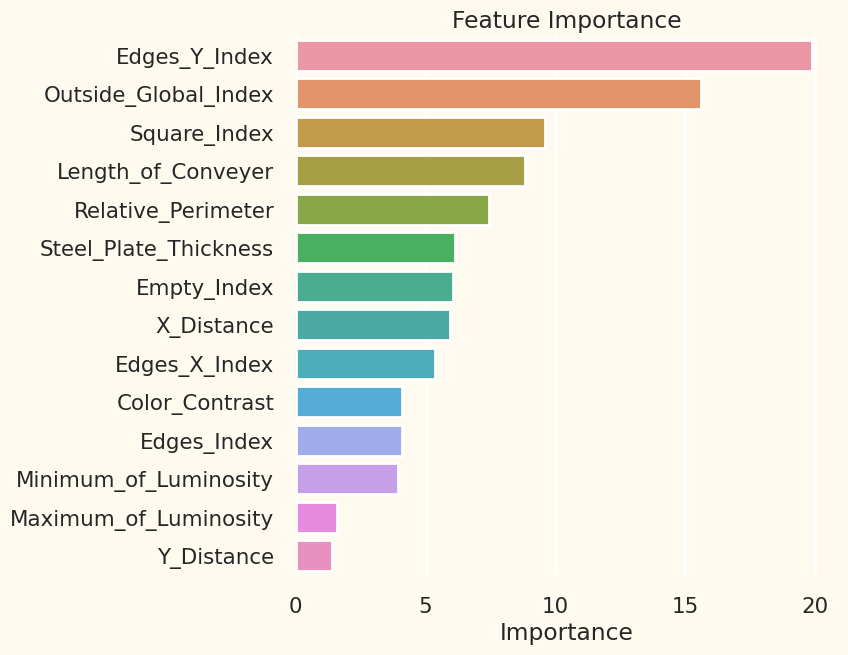

In [99]:
# feature importances
feature_importance = cb_model_for_y1.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

In [100]:
catboost_best_params_for_y2 = {'learning_rate': 0.015425810366835855, 'iterations': 412, 'depth': 7, 'colsample_bylevel': 0.5052639872618276, 'l2_leaf_reg': 1.3149430902565675, 'border_count': 138}

In [101]:
cb_model_for_y2 = CatBoostClassifier(**catboost_best_params_for_y2)
cb_model_for_y2.fit( x, y2)

0:	learn: 0.6593036	total: 8.42ms	remaining: 3.46s
1:	learn: 0.6345245	total: 16.7ms	remaining: 3.42s
2:	learn: 0.6079144	total: 25.7ms	remaining: 3.5s
3:	learn: 0.5913716	total: 32.8ms	remaining: 3.34s
4:	learn: 0.5713271	total: 39.7ms	remaining: 3.23s
5:	learn: 0.5442008	total: 46.7ms	remaining: 3.16s
6:	learn: 0.5293848	total: 54.5ms	remaining: 3.15s
7:	learn: 0.5151299	total: 61.8ms	remaining: 3.12s
8:	learn: 0.5023306	total: 69ms	remaining: 3.09s
9:	learn: 0.4841454	total: 76.3ms	remaining: 3.07s
10:	learn: 0.4627343	total: 84ms	remaining: 3.06s
11:	learn: 0.4464505	total: 91.3ms	remaining: 3.04s
12:	learn: 0.4278692	total: 99.7ms	remaining: 3.06s
13:	learn: 0.4132091	total: 108ms	remaining: 3.07s
14:	learn: 0.3974138	total: 116ms	remaining: 3.07s
15:	learn: 0.3831969	total: 124ms	remaining: 3.08s
16:	learn: 0.3715213	total: 132ms	remaining: 3.08s
17:	learn: 0.3603832	total: 140ms	remaining: 3.06s
18:	learn: 0.3484039	total: 148ms	remaining: 3.07s
19:	learn: 0.3377995	total: 156ms

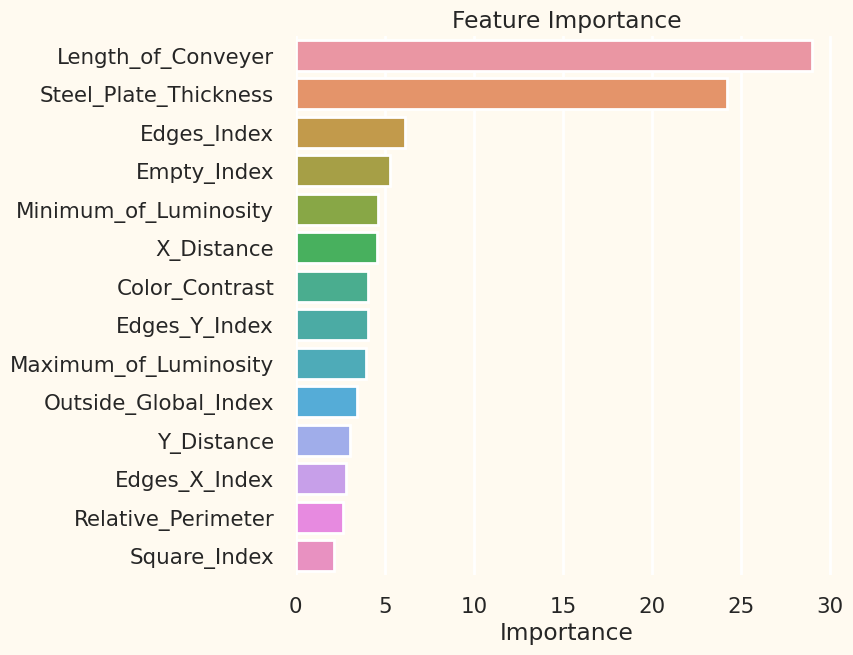

In [102]:
# feature importances
feature_importance = cb_model_for_y2.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

In [103]:
catboost_best_params_for_y3 = {'learning_rate': 0.010867161062364518, 'iterations': 784, 'depth': 6, 'colsample_bylevel': 0.6404490518712853, 'l2_leaf_reg': 1.3213552012355676, 'border_count': 89}

In [104]:
cb_model_for_y3 = CatBoostClassifier(**catboost_best_params_for_y3)
cb_model_for_y3.fit( x, y3)

0:	learn: 0.6705970	total: 7.07ms	remaining: 5.53s
1:	learn: 0.6473412	total: 13.9ms	remaining: 5.45s
2:	learn: 0.6294850	total: 20.3ms	remaining: 5.29s
3:	learn: 0.6142694	total: 26.3ms	remaining: 5.13s
4:	learn: 0.5990071	total: 32.8ms	remaining: 5.11s
5:	learn: 0.5801653	total: 39.1ms	remaining: 5.07s
6:	learn: 0.5644896	total: 45.3ms	remaining: 5.03s
7:	learn: 0.5471363	total: 51ms	remaining: 4.95s
8:	learn: 0.5329224	total: 57.3ms	remaining: 4.93s
9:	learn: 0.5207939	total: 63.1ms	remaining: 4.88s
10:	learn: 0.5089485	total: 69.1ms	remaining: 4.85s
11:	learn: 0.4972607	total: 75ms	remaining: 4.83s
12:	learn: 0.4851232	total: 80.8ms	remaining: 4.79s
13:	learn: 0.4709123	total: 86.3ms	remaining: 4.75s
14:	learn: 0.4595102	total: 92ms	remaining: 4.72s
15:	learn: 0.4461693	total: 98.5ms	remaining: 4.73s
16:	learn: 0.4326585	total: 105ms	remaining: 4.72s
17:	learn: 0.4217167	total: 111ms	remaining: 4.72s
18:	learn: 0.4124010	total: 117ms	remaining: 4.73s
19:	learn: 0.4034514	total: 124

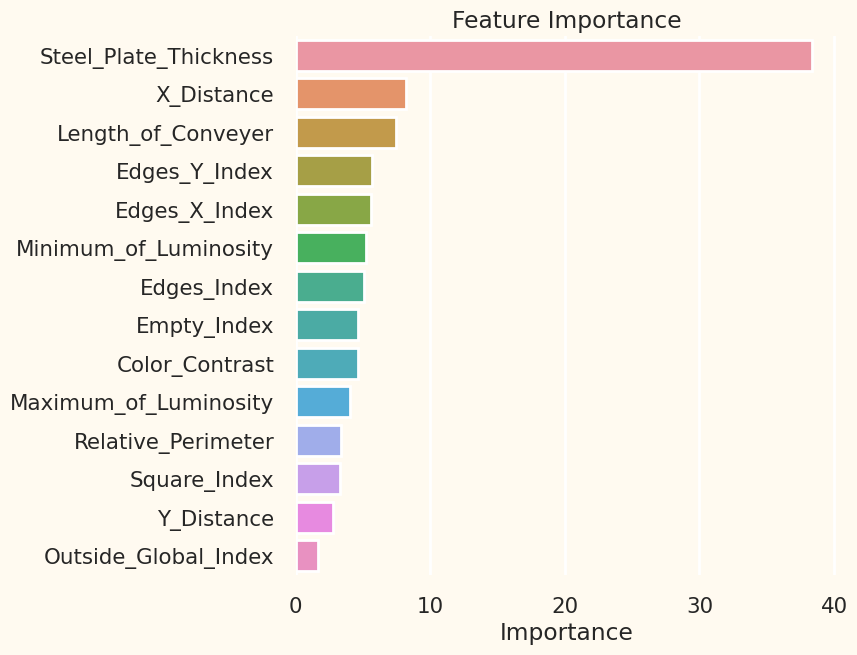

In [105]:
# feature importances
feature_importance = cb_model_for_y3.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

In [106]:
catboost_best_params_for_y4 = {'learning_rate': 0.011069968688930204, 'iterations': 296, 'depth': 10, 'colsample_bylevel': 0.7177620144561173, 'l2_leaf_reg': 0.39954565400339703, 'border_count': 49}

In [107]:
cb_model_for_y4 = CatBoostClassifier(**catboost_best_params_for_y4)
cb_model_for_y4.fit( x, y4)

0:	learn: 0.6568948	total: 22.6ms	remaining: 6.66s
1:	learn: 0.6256803	total: 43.7ms	remaining: 6.43s
2:	learn: 0.5904462	total: 64.3ms	remaining: 6.28s
3:	learn: 0.5615972	total: 86.8ms	remaining: 6.33s
4:	learn: 0.5356764	total: 109ms	remaining: 6.34s
5:	learn: 0.5106781	total: 132ms	remaining: 6.4s
6:	learn: 0.4877181	total: 154ms	remaining: 6.36s
7:	learn: 0.4655834	total: 177ms	remaining: 6.35s
8:	learn: 0.4404798	total: 197ms	remaining: 6.29s
9:	learn: 0.4174844	total: 217ms	remaining: 6.2s
10:	learn: 0.3937808	total: 239ms	remaining: 6.2s
11:	learn: 0.3751633	total: 258ms	remaining: 6.11s
12:	learn: 0.3548246	total: 277ms	remaining: 6.04s
13:	learn: 0.3351047	total: 299ms	remaining: 6.02s
14:	learn: 0.3184229	total: 321ms	remaining: 6.01s
15:	learn: 0.3057821	total: 341ms	remaining: 5.97s
16:	learn: 0.2941629	total: 348ms	remaining: 5.71s
17:	learn: 0.2818802	total: 366ms	remaining: 5.65s
18:	learn: 0.2695163	total: 387ms	remaining: 5.64s
19:	learn: 0.2559304	total: 399ms	remain

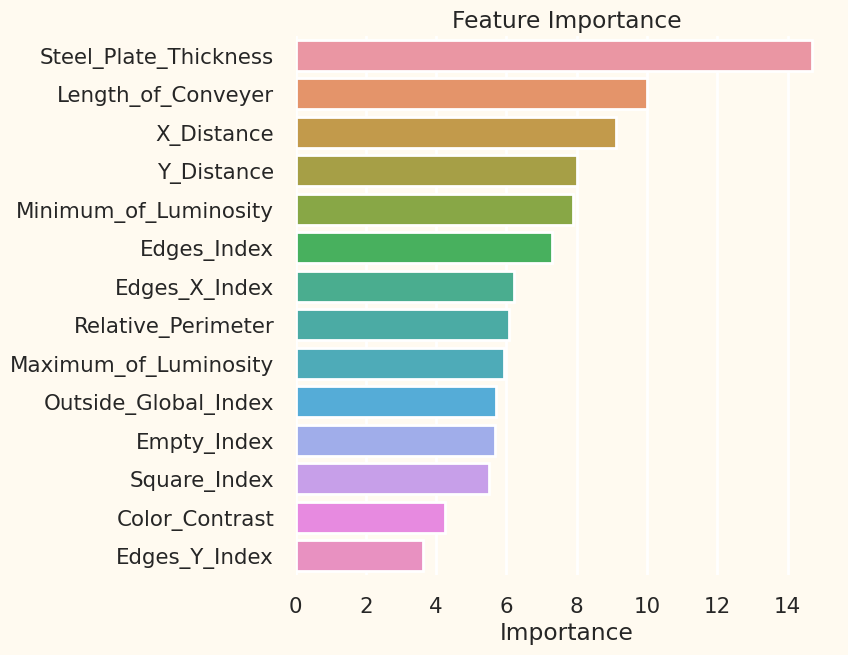

In [108]:
# feature importances
feature_importance = cb_model_for_y4.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

In [109]:
catboost_best_params_for_y5 = {'learning_rate': 0.04284810751912957, 'iterations': 404, 'depth': 3, 'colsample_bylevel': 0.581121623603289, 'l2_leaf_reg': 1.9648480525658665, 'border_count': 125}

In [110]:
cb_model_for_y5 = CatBoostClassifier(**catboost_best_params_for_y5)
cb_model_for_y5.fit( x, y5)

0:	learn: 0.6209711	total: 4.76ms	remaining: 1.92s
1:	learn: 0.5574919	total: 9.41ms	remaining: 1.89s
2:	learn: 0.5009782	total: 14.2ms	remaining: 1.89s
3:	learn: 0.4486597	total: 18.4ms	remaining: 1.84s
4:	learn: 0.4032786	total: 22.6ms	remaining: 1.81s
5:	learn: 0.3639800	total: 26.9ms	remaining: 1.79s
6:	learn: 0.3292043	total: 31.4ms	remaining: 1.78s
7:	learn: 0.3024608	total: 35.8ms	remaining: 1.77s
8:	learn: 0.2777450	total: 40.3ms	remaining: 1.77s
9:	learn: 0.2557873	total: 44.7ms	remaining: 1.76s
10:	learn: 0.2369043	total: 49.2ms	remaining: 1.76s
11:	learn: 0.2192061	total: 53.2ms	remaining: 1.74s
12:	learn: 0.2036678	total: 57.5ms	remaining: 1.73s
13:	learn: 0.1907249	total: 62ms	remaining: 1.73s
14:	learn: 0.1789468	total: 66.4ms	remaining: 1.72s
15:	learn: 0.1705431	total: 70.7ms	remaining: 1.71s
16:	learn: 0.1633112	total: 74.9ms	remaining: 1.71s
17:	learn: 0.1558777	total: 79.1ms	remaining: 1.7s
18:	learn: 0.1497301	total: 83.8ms	remaining: 1.7s
19:	learn: 0.1451378	total

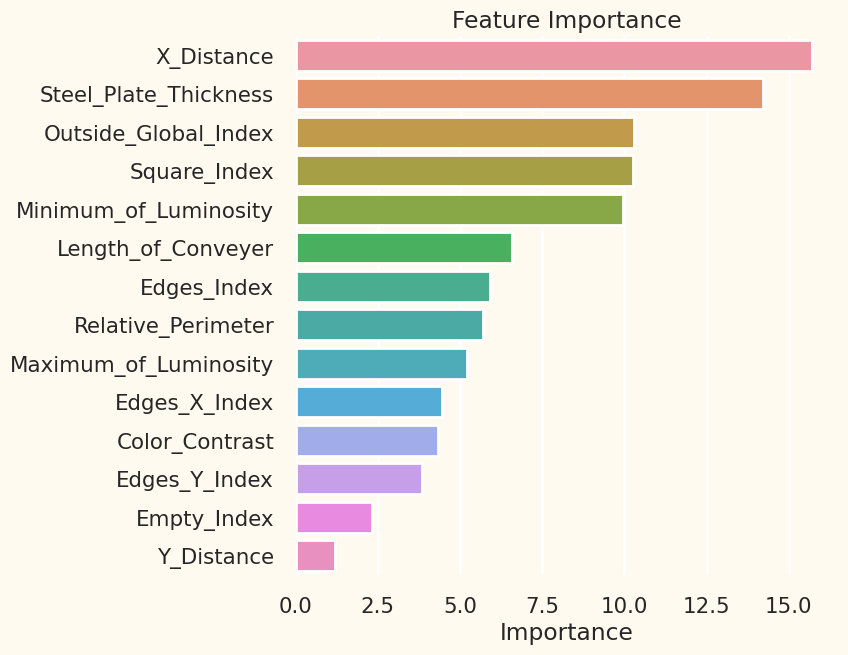

In [111]:
# feature importances
feature_importance = cb_model_for_y5.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

In [112]:
catboost_best_params_for_y6 = {'learning_rate': 0.01545604358170143, 'iterations': 2194, 'depth': 3, 'colsample_bylevel': 0.7980294159719101, 'l2_leaf_reg': 0.9623152864082736, 'border_count': 156}

In [113]:
cb_model_for_y6 = CatBoostClassifier(**catboost_best_params_for_y6)
cb_model_for_y6.fit( x, y6)

0:	learn: 0.6843685	total: 4.63ms	remaining: 10.2s
1:	learn: 0.6759174	total: 9.26ms	remaining: 10.1s
2:	learn: 0.6679529	total: 14ms	remaining: 10.2s
3:	learn: 0.6626988	total: 17.9ms	remaining: 9.8s
4:	learn: 0.6557727	total: 22.2ms	remaining: 9.73s
5:	learn: 0.6497754	total: 26.6ms	remaining: 9.69s
6:	learn: 0.6442425	total: 30.8ms	remaining: 9.63s
7:	learn: 0.6382322	total: 35.3ms	remaining: 9.64s
8:	learn: 0.6321199	total: 39.4ms	remaining: 9.58s
9:	learn: 0.6271865	total: 43.3ms	remaining: 9.45s
10:	learn: 0.6215121	total: 47ms	remaining: 9.33s
11:	learn: 0.6150329	total: 51.5ms	remaining: 9.37s
12:	learn: 0.6109199	total: 55.7ms	remaining: 9.35s
13:	learn: 0.6069448	total: 59.6ms	remaining: 9.29s
14:	learn: 0.6033623	total: 63.8ms	remaining: 9.27s
15:	learn: 0.5992519	total: 67.9ms	remaining: 9.25s
16:	learn: 0.5955788	total: 71.9ms	remaining: 9.21s
17:	learn: 0.5923586	total: 75.9ms	remaining: 9.17s
18:	learn: 0.5887747	total: 79.7ms	remaining: 9.12s
19:	learn: 0.5856129	total:

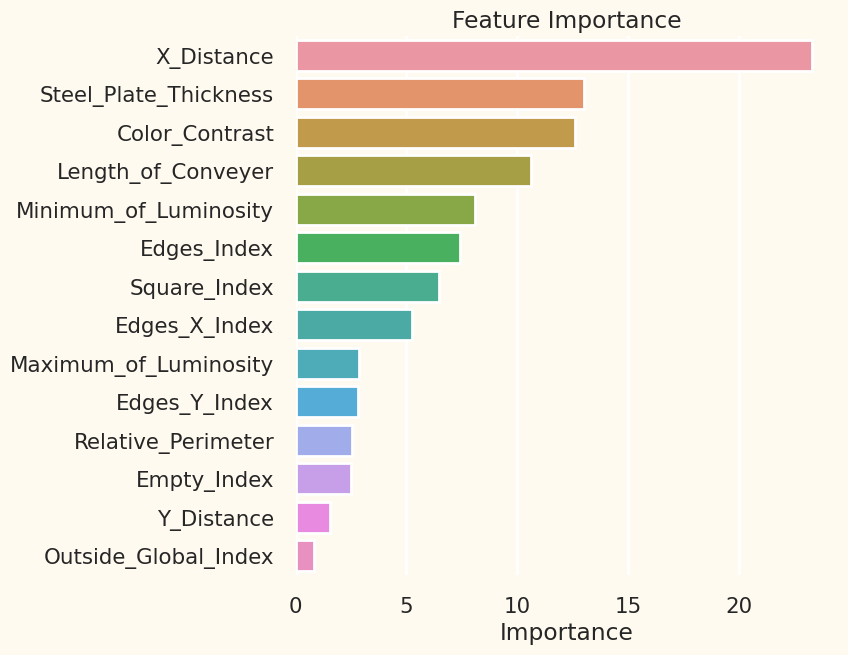

In [114]:
# feature importances
feature_importance = cb_model_for_y6.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

In [115]:
catboost_best_params_for_y7 = {'learning_rate': 0.023417823828406396, 'iterations': 879, 'depth': 5, 'colsample_bylevel': 0.7071741645277655, 'l2_leaf_reg': 1.9992347169986804, 'border_count': 152}

In [116]:
cb_model_for_y7 = CatBoostClassifier(**catboost_best_params_for_y7)
cb_model_for_y7.fit( x, y7)

0:	learn: 0.6876645	total: 6.63ms	remaining: 5.82s
1:	learn: 0.6826537	total: 12.5ms	remaining: 5.47s
2:	learn: 0.6775992	total: 18.1ms	remaining: 5.29s
3:	learn: 0.6729381	total: 23.6ms	remaining: 5.16s
4:	learn: 0.6683795	total: 29.2ms	remaining: 5.1s
5:	learn: 0.6642958	total: 34.3ms	remaining: 4.99s
6:	learn: 0.6601236	total: 39ms	remaining: 4.86s
7:	learn: 0.6563957	total: 44.5ms	remaining: 4.84s
8:	learn: 0.6528219	total: 49.8ms	remaining: 4.82s
9:	learn: 0.6495415	total: 54.9ms	remaining: 4.77s
10:	learn: 0.6462994	total: 60.1ms	remaining: 4.75s
11:	learn: 0.6433233	total: 65.3ms	remaining: 4.72s
12:	learn: 0.6403644	total: 70.7ms	remaining: 4.71s
13:	learn: 0.6376524	total: 75.9ms	remaining: 4.69s
14:	learn: 0.6349273	total: 81.2ms	remaining: 4.68s
15:	learn: 0.6324102	total: 86.4ms	remaining: 4.66s
16:	learn: 0.6302936	total: 91.6ms	remaining: 4.64s
17:	learn: 0.6279394	total: 96.9ms	remaining: 4.63s
18:	learn: 0.6257784	total: 102ms	remaining: 4.63s
19:	learn: 0.6236882	total

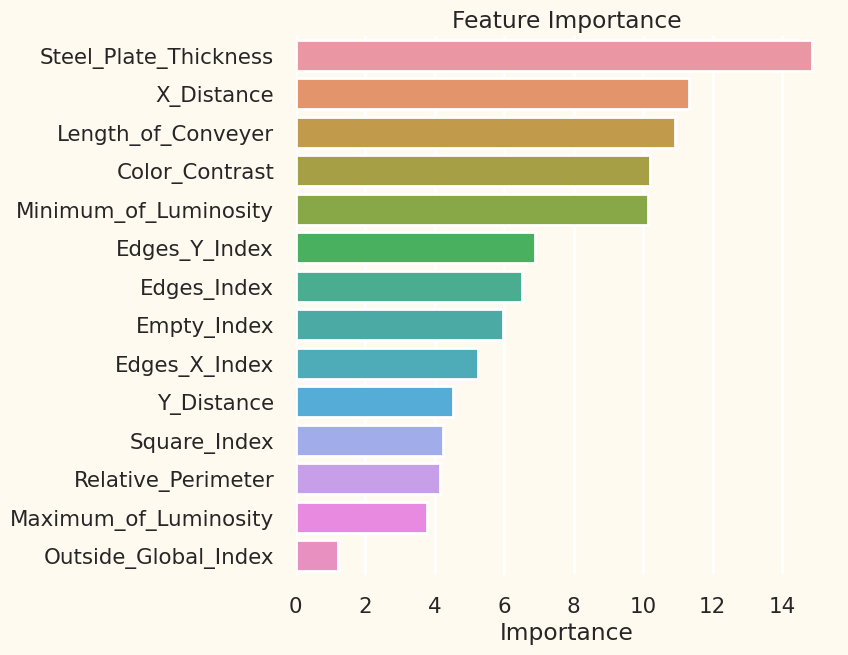

In [117]:
# feature importances
feature_importance = cb_model_for_y7.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

## <div style="text-align: left; background-color:aliceblue ; font-family: jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> LGBM Classifier </div>

In [118]:
'''def objective(trial):
    params = {
        'objective': 'binary',
        'metric': 'auc',
        'verbosity': -1,
        'boosting_type': 'gbdt',
        'lambda_l1': 0.0,
        'lambda_l2': 0.0,
        'num_leaves': trial.suggest_int('num_leaves', 10, 200),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 1.0),
        'subsample': trial.suggest_float('subsample', 0.1, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 1, 10),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1)
    }
    
    print('Training the model with', x.shape[1], 'features')
    
    lgb_classifier = LGBMClassifier(**params)
    
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    cv_results = cross_val_score(lgb_classifier, x, y7, cv=cv, scoring='roc_auc')
    
    validation_score = np.mean(cv_results)
    
    return validation_score
'''

"def objective(trial):\n    params = {\n        'objective': 'binary',\n        'metric': 'auc',\n        'verbosity': -1,\n        'boosting_type': 'gbdt',\n        'lambda_l1': 0.0,\n        'lambda_l2': 0.0,\n        'num_leaves': trial.suggest_int('num_leaves', 10, 200),\n        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 1.0),\n        'subsample': trial.suggest_float('subsample', 0.1, 1.0),\n        'bagging_freq': trial.suggest_int('bagging_freq', 1, 10),\n        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),\n        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1)\n    }\n    \n    print('Training the model with', x.shape[1], 'features')\n    \n    lgb_classifier = LGBMClassifier(**params)\n    \n    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)\n    cv_results = cross_val_score(lgb_classifier, x, y7, cv=cv, scoring='roc_auc')\n    \n    validation_score = np.mean(cv_results)\n    \n    return valid

In [119]:
# Set up Optuna study
#study = optuna.create_study(direction='maximize')
#study.optimize(objective, n_trials=100)

# Get the best hyperparameters
#best_params = study.best_params
#print("Best Hyperparameters for y7:", best_params)

In [120]:
lgbm_best_params_for_y1 = {'num_leaves': 22, 'colsample_bytree': 0.3958597306048593, 'subsample': 0.7862022402010561, 'bagging_freq': 1, 'min_child_samples': 60, 'learning_rate': 0.042907170869221634}

In [121]:
lgbm_model_for_y1 = LGBMClassifier(**lgbm_best_params_for_y1)
lgbm_model_for_y1.fit( x, y1)

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Info] Number of positive: 1466, number of negative: 17753
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003889 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2485
[LightGBM] [Info] Number of data points in the train set: 19219, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.076279 -> initscore=-2.494017
[LightGBM] [Info] Start training from score -2.494017


LGBMClassifier(bagging_freq=1, colsample_bytree=0.3958597306048593,
               learning_rate=0.042907170869221634, min_child_samples=60,
               num_leaves=22, subsample=0.7862022402010561)

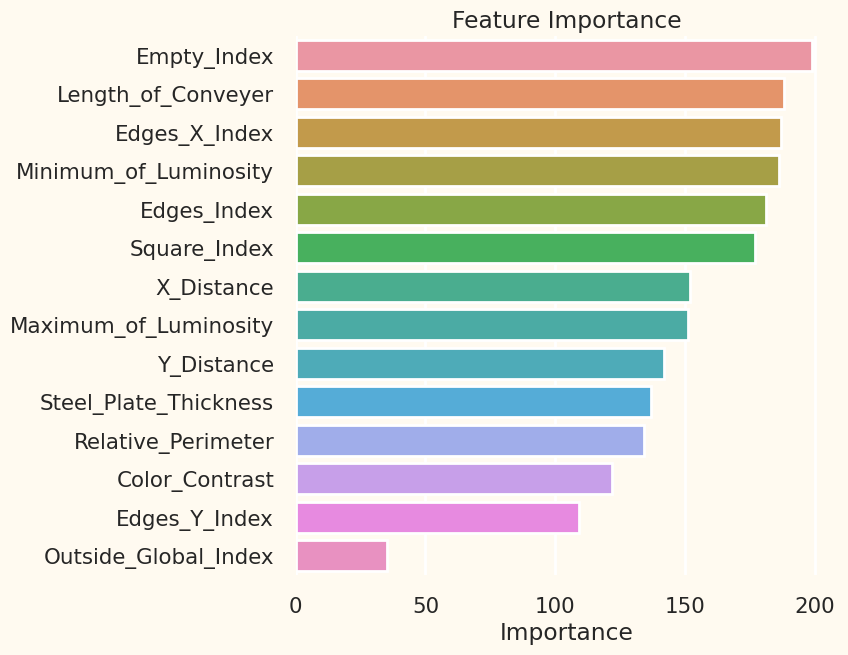

In [122]:
# feature importances
feature_importance = lgbm_model_for_y1.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

In [123]:
lgbm_best_params_for_y2 = {'num_leaves': 14, 'colsample_bytree': 0.48899169131384695, 'subsample': 0.8141629899642782, 'bagging_freq': 5, 'min_child_samples': 23, 'learning_rate': 0.052055909060145705}

In [124]:
lgbm_model_for_y2 = LGBMClassifier(**lgbm_best_params_for_y2)
lgbm_model_for_y2.fit( x, y2)

[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Info] Number of positive: 1150, number of negative: 18069
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2485
[LightGBM] [Info] Number of data points in the train set: 19219, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.059837 -> initscore=-2.754436
[LightGBM] [Info] Start training from score -2.754436


LGBMClassifier(bagging_freq=5, colsample_bytree=0.48899169131384695,
               learning_rate=0.052055909060145705, min_child_samples=23,
               num_leaves=14, subsample=0.8141629899642782)

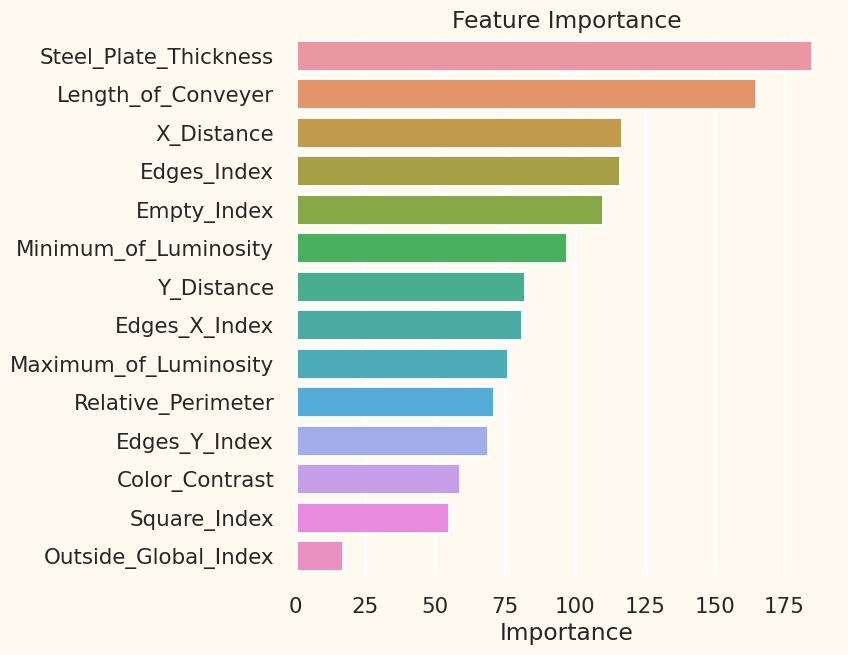

In [125]:
# feature importances
feature_importance = lgbm_model_for_y2.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

In [126]:
lgbm_best_params_for_y3 = {'num_leaves': 86, 'colsample_bytree': 0.6890167831633236, 'subsample': 0.435944923722699, 'bagging_freq': 5, 'min_child_samples': 96, 'learning_rate': 0.04780505050952477}

In [127]:
lgbm_model_for_y3 = LGBMClassifier(**lgbm_best_params_for_y3)
lgbm_model_for_y3.fit( x, y3)

[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Info] Number of positive: 3432, number of negative: 15787
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006167 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2485
[LightGBM] [Info] Number of data points in the train set: 19219, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.178573 -> initscore=-1.526044
[LightGBM] [Info] Start training from score -1.526044
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

LGBMClassifier(bagging_freq=5, colsample_bytree=0.6890167831633236,
               learning_rate=0.04780505050952477, min_child_samples=96,
               num_leaves=86, subsample=0.435944923722699)

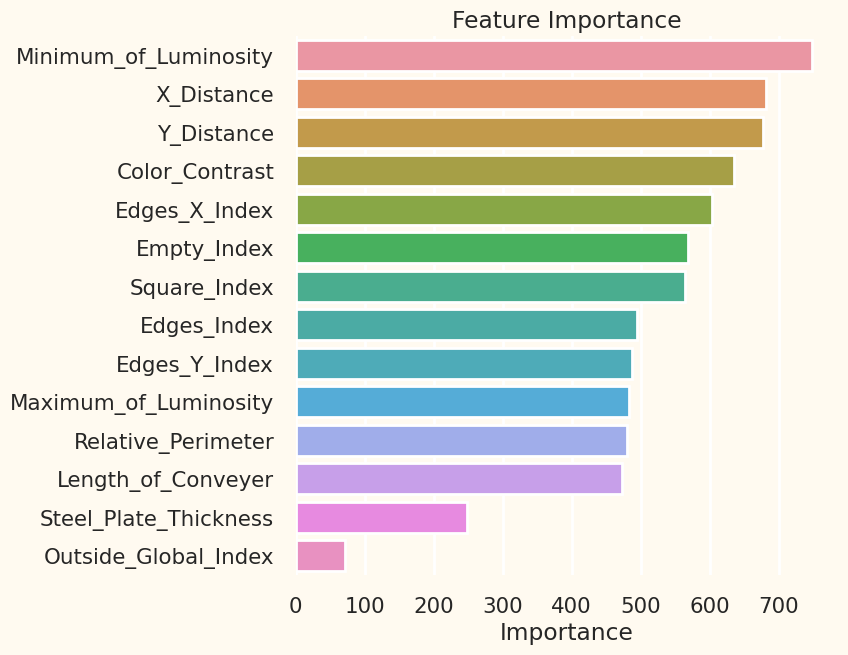

In [128]:
# feature importances
feature_importance = lgbm_model_for_y3.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

In [129]:
lgbm_best_params_for_y4 = {'num_leaves': 77, 'colsample_bytree': 0.39794271020184496, 'subsample': 0.4543724665676397, 'bagging_freq': 1, 'min_child_samples': 38, 'learning_rate': 0.02530640328149112}

In [130]:
lgbm_model_for_y4 = LGBMClassifier(**lgbm_best_params_for_y4)
lgbm_model_for_y4.fit( x, y4)

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Info] Number of positive: 568, number of negative: 18651
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2485
[LightGBM] [Info] Number of data points in the train set: 19219, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.029554 -> initscore=-3.491534
[LightGBM] [Info] Start training from score -3.491534
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


LGBMClassifier(bagging_freq=1, colsample_bytree=0.39794271020184496,
               learning_rate=0.02530640328149112, min_child_samples=38,
               num_leaves=77, subsample=0.4543724665676397)

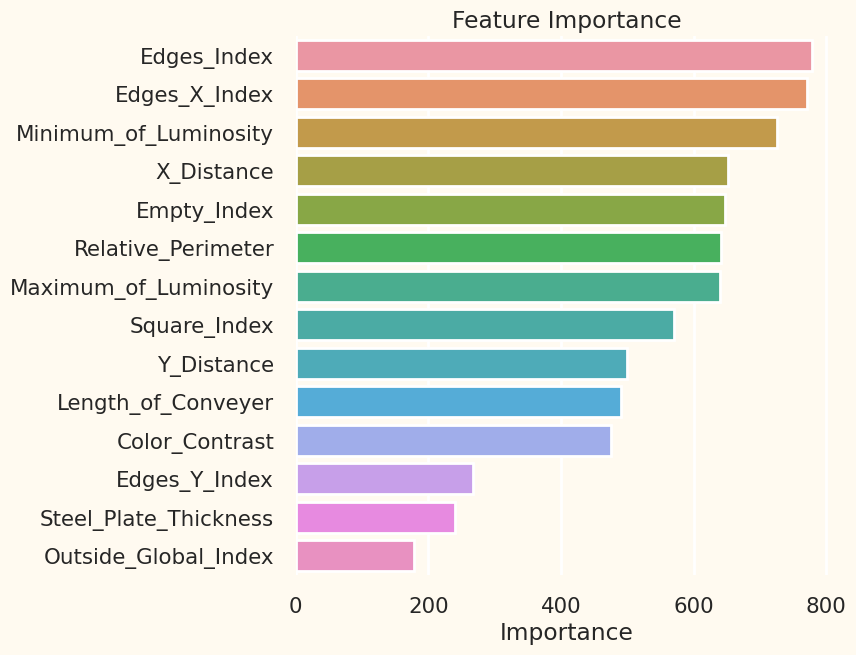

In [131]:
# feature importances
feature_importance = lgbm_model_for_y4.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

In [132]:
lgbm_best_params_for_y5 = {'num_leaves': 21, 'colsample_bytree': 0.5719703333809595, 'subsample': 0.8845917568701154, 'bagging_freq': 8, 'min_child_samples': 83, 'learning_rate': 0.036830054331436074}

In [133]:
lgbm_model_for_y5 = LGBMClassifier(**lgbm_best_params_for_y5)
lgbm_model_for_y5.fit( x, y5)

[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Info] Number of positive: 485, number of negative: 18734
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005353 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2485
[LightGBM] [Info] Number of data points in the train set: 19219, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.025235 -> initscore=-3.653946
[LightGBM] [Info] Start training from score -3.653946


LGBMClassifier(bagging_freq=8, colsample_bytree=0.5719703333809595,
               learning_rate=0.036830054331436074, min_child_samples=83,
               num_leaves=21, subsample=0.8845917568701154)

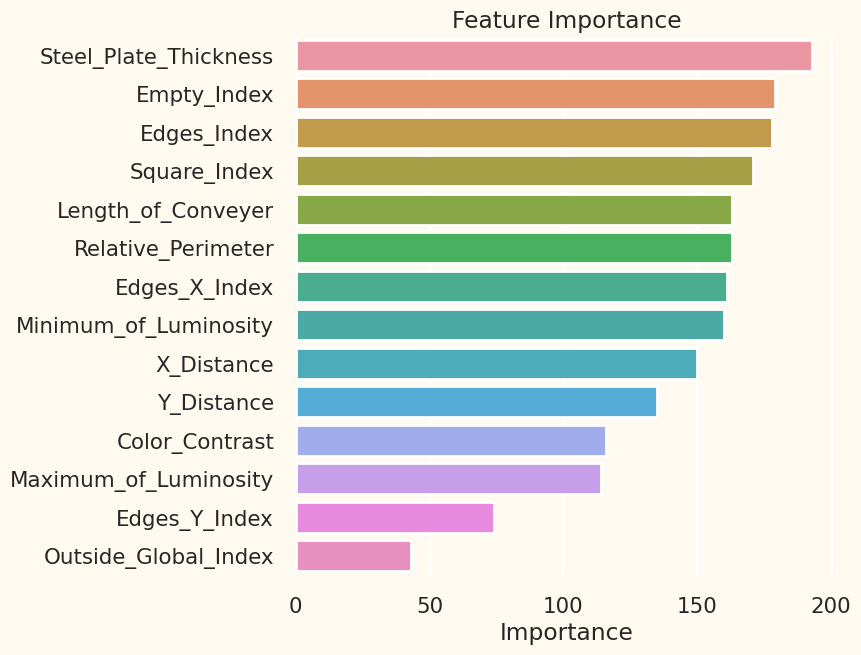

In [134]:
# feature importances
feature_importance = lgbm_model_for_y5.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

In [135]:
lgbm_best_params_for_y6 = {'num_leaves': 31, 'colsample_bytree': 0.6981677329824915, 'subsample': 0.928709504204017, 'bagging_freq': 8, 'min_child_samples': 94, 'learning_rate': 0.04633257768327653}

In [136]:
lgbm_model_for_y6 = LGBMClassifier(**lgbm_best_params_for_y6)
lgbm_model_for_y6.fit( x, y6)

[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Info] Number of positive: 4763, number of negative: 14456
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2485
[LightGBM] [Info] Number of data points in the train set: 19219, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.247828 -> initscore=-1.110232
[LightGBM] [Info] Start training from score -1.110232


LGBMClassifier(bagging_freq=8, colsample_bytree=0.6981677329824915,
               learning_rate=0.04633257768327653, min_child_samples=94,
               subsample=0.928709504204017)

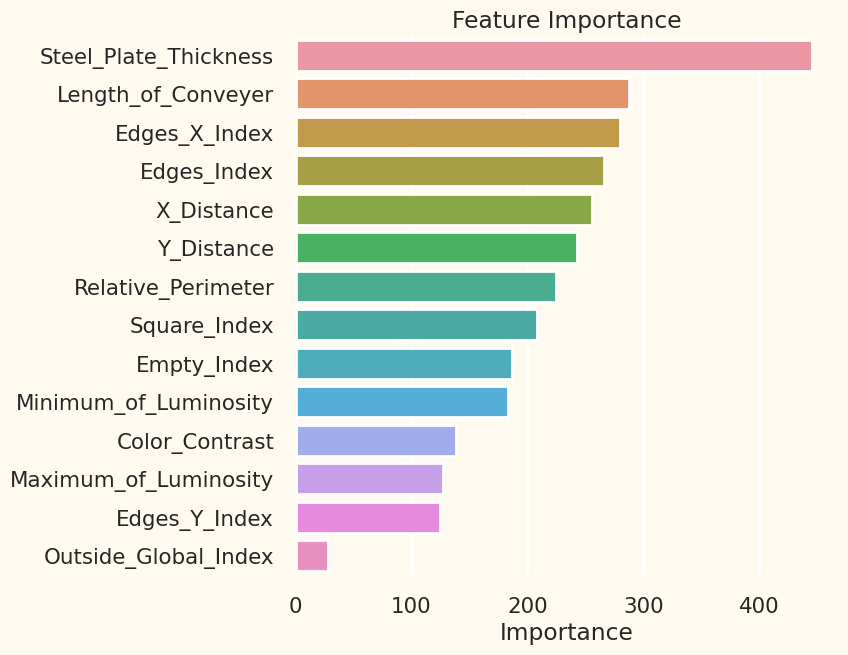

In [137]:
# feature importances
feature_importance = lgbm_model_for_y6.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

In [138]:
lgbm_best_params_for_y7 = {'num_leaves': 17, 'colsample_bytree': 0.5248859203801881, 'subsample': 0.6117334114993483, 'bagging_freq': 1, 'min_child_samples': 40, 'learning_rate': 0.03758594298111176}

In [139]:
lgbm_model_for_y7 = LGBMClassifier(**lgbm_best_params_for_y7)
lgbm_model_for_y7.fit( x, y7)

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Info] Number of positive: 6558, number of negative: 12661
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2485
[LightGBM] [Info] Number of data points in the train set: 19219, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.341225 -> initscore=-0.657841
[LightGBM] [Info] Start training from score -0.657841


LGBMClassifier(bagging_freq=1, colsample_bytree=0.5248859203801881,
               learning_rate=0.03758594298111176, min_child_samples=40,
               num_leaves=17, subsample=0.6117334114993483)

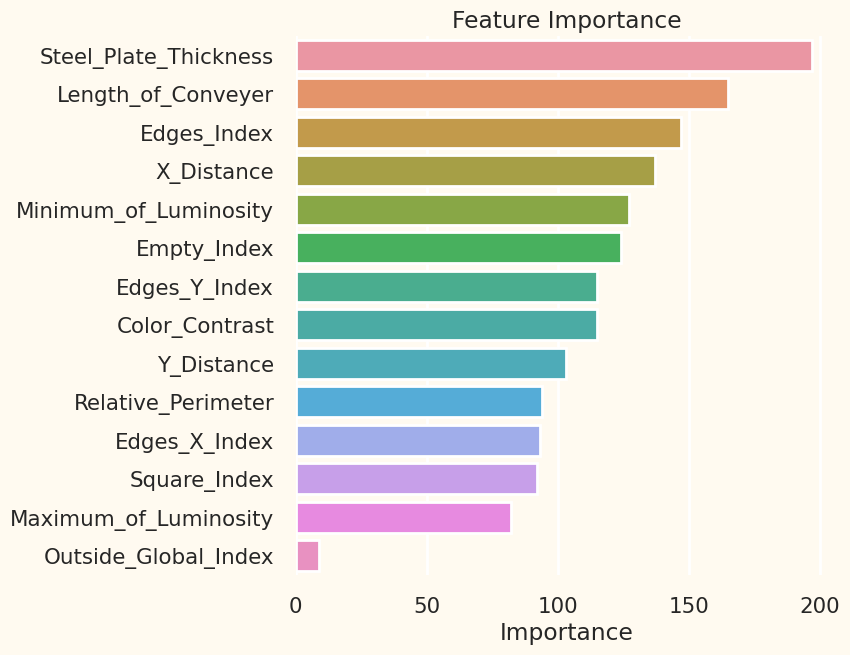

In [140]:
# feature importances
feature_importance = lgbm_model_for_y7.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(7, 7))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('')
sns.despine(left=True, bottom=True)
plt.show()

## <div style="text-align: left; background-color:aliceblue ; font-family: jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Ensemble Model </div>

# Ensemble model for y1

In [141]:
ensemble_model_for_y1 = VotingClassifier(
    estimators=[
        ('xgb', xgb_model_for_y1),
        ('catboost',cb_model_for_y1),
        ('LGBM', lgbm_model_for_y1)
    ],
    voting='soft',
    flatten_transform=True
)

# Use AUC-ROC as the scoring parameter
auc_roc_scores = cross_val_score(ensemble_model_for_y1, x, y1, cv=5, scoring='roc_auc')

print("AUC-ROC scores for each fold:", auc_roc_scores)
print("Average AUC-ROC:", auc_roc_scores.mean())

0:	learn: 0.6648466	total: 6.45ms	remaining: 1.12s
1:	learn: 0.6385515	total: 12.5ms	remaining: 1.08s
2:	learn: 0.6140018	total: 18.1ms	remaining: 1.04s
3:	learn: 0.5915139	total: 25.3ms	remaining: 1.08s
4:	learn: 0.5705548	total: 30.7ms	remaining: 1.04s
5:	learn: 0.5508111	total: 35.5ms	remaining: 1000ms
6:	learn: 0.5322509	total: 43.7ms	remaining: 1.05s
7:	learn: 0.5148595	total: 49.1ms	remaining: 1.02s
8:	learn: 0.4987695	total: 53.7ms	remaining: 991ms
9:	learn: 0.4834877	total: 59.7ms	remaining: 986ms
10:	learn: 0.4692038	total: 65.2ms	remaining: 972ms
11:	learn: 0.4557861	total: 72.2ms	remaining: 980ms
12:	learn: 0.4431660	total: 77.7ms	remaining: 968ms
13:	learn: 0.4310786	total: 82.9ms	remaining: 954ms
14:	learn: 0.4198098	total: 86.8ms	remaining: 926ms
15:	learn: 0.4092452	total: 91.7ms	remaining: 911ms
16:	learn: 0.3992014	total: 95.9ms	remaining: 891ms
17:	learn: 0.3898083	total: 100ms	remaining: 874ms
18:	learn: 0.3809622	total: 104ms	remaining: 855ms
19:	learn: 0.3725669	to

In [142]:
ensemble_model_for_y1.fit(x,y1)

0:	learn: 0.6648185	total: 4.84ms	remaining: 842ms
1:	learn: 0.6385010	total: 9.47ms	remaining: 819ms
2:	learn: 0.6138752	total: 13.8ms	remaining: 793ms
3:	learn: 0.5913166	total: 18.4ms	remaining: 788ms
4:	learn: 0.5700536	total: 23.1ms	remaining: 787ms
5:	learn: 0.5503309	total: 27.1ms	remaining: 764ms
6:	learn: 0.5317746	total: 30.7ms	remaining: 737ms
7:	learn: 0.5143478	total: 34.9ms	remaining: 729ms
8:	learn: 0.4982727	total: 38.9ms	remaining: 718ms
9:	learn: 0.4830304	total: 42.7ms	remaining: 705ms
10:	learn: 0.4687357	total: 46.7ms	remaining: 697ms
11:	learn: 0.4552637	total: 52.5ms	remaining: 713ms
12:	learn: 0.4426302	total: 56.6ms	remaining: 706ms
13:	learn: 0.4305391	total: 61ms	remaining: 701ms
14:	learn: 0.4193509	total: 65.1ms	remaining: 694ms
15:	learn: 0.4087779	total: 69.2ms	remaining: 687ms
16:	learn: 0.3987485	total: 73.1ms	remaining: 679ms
17:	learn: 0.3893382	total: 77.2ms	remaining: 674ms
18:	learn: 0.3806414	total: 81.6ms	remaining: 670ms
19:	learn: 0.3722533	tot

VotingClassifier(estimators=[('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=0.42741895633525795,
                                            device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None,
                                            gamma=0.2906258680984795,
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction...
                                            multi_strategy=None,
                                            n_estimators=183, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...)),
                             ('catboost',
                              <catboost.core.CatBoostClassifier object at 0x79b6a7e51930>),
                             ('LGBM',
                              LGBMClassifier(bagging_freq=1,
                                             colsample_bytree=0.3958597306048593,
                                             learning_rate=0.042907170869221634,
                                             min_child_samples=60,
                                             num_leaves=22,
                                             subsample=0.7862022402010561))],
                 voting='soft')

In [143]:
Pastry = ensemble_model_for_y1.predict_proba(test_df)

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


In [144]:
Pastry = Pastry[:,1]

In [145]:
Pastry

array([0.39538387, 0.20373736, 0.00892745, ..., 0.00432653, 0.31761419,
       0.00596456])

# Ensemble model for y2

In [146]:
ensemble_model_for_y2 = VotingClassifier(
    estimators=[
        ('xgb', xgb_model_for_y2),
        ('catboost',cb_model_for_y2),
        ('LGBM', lgbm_model_for_y2)
    ],
    voting='soft',
    flatten_transform=True
)

# Use AUC-ROC as the scoring parameter
auc_roc_scores = cross_val_score(ensemble_model_for_y2, x, y2, cv=5, scoring='roc_auc')

print("AUC-ROC scores for each fold:", auc_roc_scores)
print("Average AUC-ROC:", auc_roc_scores.mean())

0:	learn: 0.6606443	total: 7.68ms	remaining: 3.16s
1:	learn: 0.6354798	total: 15.1ms	remaining: 3.09s
2:	learn: 0.6083982	total: 23.5ms	remaining: 3.2s
3:	learn: 0.5916988	total: 30.7ms	remaining: 3.13s
4:	learn: 0.5715965	total: 37.4ms	remaining: 3.04s
5:	learn: 0.5448606	total: 44.3ms	remaining: 3s
6:	learn: 0.5232502	total: 51.7ms	remaining: 2.99s
7:	learn: 0.5102445	total: 58.5ms	remaining: 2.96s
8:	learn: 0.4940909	total: 65.3ms	remaining: 2.92s
9:	learn: 0.4781284	total: 72ms	remaining: 2.89s
10:	learn: 0.4609392	total: 79.7ms	remaining: 2.9s
11:	learn: 0.4448360	total: 86.8ms	remaining: 2.89s
12:	learn: 0.4290135	total: 94.2ms	remaining: 2.89s
13:	learn: 0.4145049	total: 102ms	remaining: 2.91s
14:	learn: 0.3983671	total: 110ms	remaining: 2.91s
15:	learn: 0.3834280	total: 117ms	remaining: 2.9s
16:	learn: 0.3699325	total: 124ms	remaining: 2.89s
17:	learn: 0.3586953	total: 131ms	remaining: 2.87s
18:	learn: 0.3481307	total: 138ms	remaining: 2.85s
19:	learn: 0.3374890	total: 145ms	re

In [147]:
ensemble_model_for_y2.fit(x,y2)

0:	learn: 0.6593036	total: 7.2ms	remaining: 2.96s
1:	learn: 0.6345245	total: 15.6ms	remaining: 3.21s
2:	learn: 0.6079144	total: 25.4ms	remaining: 3.46s
3:	learn: 0.5913716	total: 33.2ms	remaining: 3.39s
4:	learn: 0.5713271	total: 40.8ms	remaining: 3.32s
5:	learn: 0.5442008	total: 48.8ms	remaining: 3.3s
6:	learn: 0.5293848	total: 57.6ms	remaining: 3.33s
7:	learn: 0.5151299	total: 65.6ms	remaining: 3.31s
8:	learn: 0.5023306	total: 73.9ms	remaining: 3.31s
9:	learn: 0.4841454	total: 81.2ms	remaining: 3.27s
10:	learn: 0.4627343	total: 89.5ms	remaining: 3.26s
11:	learn: 0.4464505	total: 97.6ms	remaining: 3.25s
12:	learn: 0.4278692	total: 106ms	remaining: 3.26s
13:	learn: 0.4132091	total: 115ms	remaining: 3.26s
14:	learn: 0.3974138	total: 123ms	remaining: 3.25s
15:	learn: 0.3831969	total: 132ms	remaining: 3.26s
16:	learn: 0.3715213	total: 140ms	remaining: 3.25s
17:	learn: 0.3603832	total: 147ms	remaining: 3.22s
18:	learn: 0.3484039	total: 156ms	remaining: 3.22s
19:	learn: 0.3377995	total: 163

VotingClassifier(estimators=[('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=0.10862617637568875,
                                            device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None,
                                            gamma=0.6340041422945999,
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction...
                                            multi_strategy=None,
                                            n_estimators=363, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...)),
                             ('catboost',
                              <catboost.core.CatBoostClassifier object at 0x79b6a7e535b0>),
                             ('LGBM',
                              LGBMClassifier(bagging_freq=5,
                                             colsample_bytree=0.48899169131384695,
                                             learning_rate=0.052055909060145705,
                                             min_child_samples=23,
                                             num_leaves=14,
                                             subsample=0.8141629899642782))],
                 voting='soft')

In [148]:
Z_Scratch = ensemble_model_for_y2.predict_proba(test_df)

[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


In [149]:
Z_Scratch = Z_Scratch[:,1]

In [150]:
Z_Scratch

array([0.00118579, 0.04520769, 0.04134607, ..., 0.00057976, 0.00770753,
       0.01638781])

# Ensemble model for y3

In [151]:
ensemble_model_for_y3 = VotingClassifier(
    estimators=[
        ('xgb', xgb_model_for_y3),
        ('catboost',cb_model_for_y3),
        ('LGBM', lgbm_model_for_y3)
    ],
    voting='soft',
    flatten_transform=True
)

# Use AUC-ROC as the scoring parameter
auc_roc_scores = cross_val_score(ensemble_model_for_y3, x, y3, cv=5, scoring='roc_auc')

print("AUC-ROC scores for each fold:", auc_roc_scores)
print("Average AUC-ROC:", auc_roc_scores.mean())

0:	learn: 0.6706101	total: 6.37ms	remaining: 4.99s
1:	learn: 0.6471754	total: 12.3ms	remaining: 4.82s
2:	learn: 0.6295364	total: 18.5ms	remaining: 4.82s
3:	learn: 0.6140138	total: 24.4ms	remaining: 4.75s
4:	learn: 0.5989994	total: 30.7ms	remaining: 4.78s
5:	learn: 0.5851198	total: 37ms	remaining: 4.79s
6:	learn: 0.5691546	total: 43.1ms	remaining: 4.78s
7:	learn: 0.5516017	total: 48.1ms	remaining: 4.66s
8:	learn: 0.5374862	total: 53.3ms	remaining: 4.59s
9:	learn: 0.5252159	total: 58.4ms	remaining: 4.52s
10:	learn: 0.5133070	total: 63.6ms	remaining: 4.47s
11:	learn: 0.5015303	total: 69.5ms	remaining: 4.47s
12:	learn: 0.4889403	total: 75.3ms	remaining: 4.46s
13:	learn: 0.4774242	total: 80.7ms	remaining: 4.44s
14:	learn: 0.4656508	total: 86.5ms	remaining: 4.43s
15:	learn: 0.4515311	total: 92.7ms	remaining: 4.45s
16:	learn: 0.4377558	total: 98.6ms	remaining: 4.45s
17:	learn: 0.4278535	total: 104ms	remaining: 4.43s
18:	learn: 0.4185655	total: 110ms	remaining: 4.44s
19:	learn: 0.4094694	total

In [152]:
ensemble_model_for_y3.fit(x,y3)

0:	learn: 0.6705970	total: 6.74ms	remaining: 5.28s
1:	learn: 0.6473412	total: 13.3ms	remaining: 5.22s
2:	learn: 0.6294850	total: 19.9ms	remaining: 5.18s
3:	learn: 0.6142694	total: 26.2ms	remaining: 5.12s
4:	learn: 0.5990071	total: 33.1ms	remaining: 5.15s
5:	learn: 0.5801653	total: 39.6ms	remaining: 5.13s
6:	learn: 0.5644896	total: 45.7ms	remaining: 5.07s
7:	learn: 0.5471363	total: 51.8ms	remaining: 5.02s
8:	learn: 0.5329224	total: 58.3ms	remaining: 5.02s
9:	learn: 0.5207939	total: 64.6ms	remaining: 5s
10:	learn: 0.5089485	total: 71.3ms	remaining: 5.01s
11:	learn: 0.4972607	total: 78ms	remaining: 5.02s
12:	learn: 0.4851232	total: 84.3ms	remaining: 5s
13:	learn: 0.4709123	total: 90ms	remaining: 4.95s
14:	learn: 0.4595102	total: 96.1ms	remaining: 4.92s
15:	learn: 0.4461693	total: 102ms	remaining: 4.91s
16:	learn: 0.4326585	total: 108ms	remaining: 4.89s
17:	learn: 0.4217167	total: 115ms	remaining: 4.88s
18:	learn: 0.4124010	total: 121ms	remaining: 4.88s
19:	learn: 0.4034514	total: 128ms	re

VotingClassifier(estimators=[('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=0.6146785948823625,
                                            device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None,
                                            gamma=0.9803945252147186,
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction_...
                                            multi_strategy=None,
                                            n_estimators=305, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...)),
                             ('catboost',
                              <catboost.core.CatBoostClassifier object at 0x79b6a7bc6290>),
                             ('LGBM',
                              LGBMClassifier(bagging_freq=5,
                                             colsample_bytree=0.6890167831633236,
                                             learning_rate=0.04780505050952477,
                                             min_child_samples=96,
                                             num_leaves=86,
                                             subsample=0.435944923722699))],
                 voting='soft')

In [153]:
K_Scatch = ensemble_model_for_y3.predict_proba(test_df)

[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


In [154]:
K_Scatch = K_Scatch[:,1]
K_Scatch

array([0.00304993, 0.02514752, 0.05033964, ..., 0.91054133, 0.02801546,
       0.88529189])

# Ensemble model for y4

In [155]:
ensemble_model_for_y4 = VotingClassifier(
    estimators=[
        ('xgb', xgb_model_for_y4),
        ('catboost',cb_model_for_y4),
        ('LGBM', lgbm_model_for_y4)
    ],
    voting='soft',
    flatten_transform=True
)

# Use AUC-ROC as the scoring parameter
auc_roc_scores = cross_val_score(ensemble_model_for_y4, x, y4, cv=5, scoring='roc_auc')

print("AUC-ROC scores for each fold:", auc_roc_scores)
print("Average AUC-ROC:", auc_roc_scores.mean())

0:	learn: 0.6575889	total: 19.8ms	remaining: 5.83s
1:	learn: 0.6267688	total: 39.3ms	remaining: 5.78s
2:	learn: 0.5987432	total: 45.1ms	remaining: 4.41s
3:	learn: 0.5734159	total: 64.2ms	remaining: 4.69s
4:	learn: 0.5441906	total: 84.1ms	remaining: 4.9s
5:	learn: 0.5178731	total: 104ms	remaining: 5.02s
6:	learn: 0.4948934	total: 124ms	remaining: 5.1s
7:	learn: 0.4728488	total: 143ms	remaining: 5.16s
8:	learn: 0.4474453	total: 165ms	remaining: 5.25s
9:	learn: 0.4287802	total: 185ms	remaining: 5.29s
10:	learn: 0.4101057	total: 205ms	remaining: 5.3s
11:	learn: 0.3884922	total: 220ms	remaining: 5.2s
12:	learn: 0.3711071	total: 239ms	remaining: 5.2s
13:	learn: 0.3552572	total: 259ms	remaining: 5.21s
14:	learn: 0.3366654	total: 281ms	remaining: 5.26s
15:	learn: 0.3189797	total: 304ms	remaining: 5.33s
16:	learn: 0.3029127	total: 329ms	remaining: 5.4s
17:	learn: 0.2899642	total: 360ms	remaining: 5.55s
18:	learn: 0.2766842	total: 380ms	remaining: 5.54s
19:	learn: 0.2627079	total: 398ms	remainin

In [156]:
ensemble_model_for_y4.fit(x,y4)

0:	learn: 0.6568948	total: 21.8ms	remaining: 6.43s
1:	learn: 0.6256803	total: 43.9ms	remaining: 6.45s
2:	learn: 0.5904462	total: 64.8ms	remaining: 6.33s
3:	learn: 0.5615972	total: 85.4ms	remaining: 6.23s
4:	learn: 0.5356764	total: 105ms	remaining: 6.09s
5:	learn: 0.5106781	total: 126ms	remaining: 6.08s
6:	learn: 0.4877181	total: 147ms	remaining: 6.06s
7:	learn: 0.4655834	total: 168ms	remaining: 6.06s
8:	learn: 0.4404798	total: 189ms	remaining: 6.03s
9:	learn: 0.4174844	total: 206ms	remaining: 5.89s
10:	learn: 0.3937808	total: 229ms	remaining: 5.93s
11:	learn: 0.3751633	total: 251ms	remaining: 5.93s
12:	learn: 0.3548246	total: 272ms	remaining: 5.93s
13:	learn: 0.3351047	total: 293ms	remaining: 5.91s
14:	learn: 0.3184229	total: 313ms	remaining: 5.87s
15:	learn: 0.3057821	total: 334ms	remaining: 5.84s
16:	learn: 0.2941629	total: 340ms	remaining: 5.58s
17:	learn: 0.2818802	total: 361ms	remaining: 5.58s
18:	learn: 0.2695163	total: 383ms	remaining: 5.59s
19:	learn: 0.2559304	total: 394ms	rem

VotingClassifier(estimators=[('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=0.20531257748426304,
                                            device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None,
                                            gamma=0.20387774287368832,
                                            grow_policy=None,
                                            importance_type=None,
                                            interactio...
                                            multi_strategy=None,
                                            n_estimators=441, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...)),
                             ('catboost',
                              <catboost.core.CatBoostClassifier object at 0x79b6a7cdf520>),
                             ('LGBM',
                              LGBMClassifier(bagging_freq=1,
                                             colsample_bytree=0.39794271020184496,
                                             learning_rate=0.02530640328149112,
                                             min_child_samples=38,
                                             num_leaves=77,
                                             subsample=0.4543724665676397))],
                 voting='soft')

In [157]:
Stains = ensemble_model_for_y4.predict_proba(test_df)

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


In [158]:
Stains = Stains[:,1]
Stains

array([0.00113788, 0.00159203, 0.00237304, ..., 0.00152841, 0.00151542,
       0.00169468])

# Ensemble model for y5

In [159]:
ensemble_model_for_y5 = VotingClassifier(
    estimators=[
        ('xgb', xgb_model_for_y5),
        ('catboost',cb_model_for_y5),
        ('LGBM', lgbm_model_for_y5)
    ],
    voting='soft',
    flatten_transform=True
)

# Use AUC-ROC as the scoring parameter
auc_roc_scores = cross_val_score(ensemble_model_for_y5, x, y5, cv=5, scoring='roc_auc')

print("AUC-ROC scores for each fold:", auc_roc_scores)
print("Average AUC-ROC:", auc_roc_scores.mean())

0:	learn: 0.6206894	total: 4.09ms	remaining: 1.65s
1:	learn: 0.5558662	total: 8.14ms	remaining: 1.64s
2:	learn: 0.4997472	total: 12.1ms	remaining: 1.61s
3:	learn: 0.4473737	total: 15.9ms	remaining: 1.59s
4:	learn: 0.4019805	total: 19.8ms	remaining: 1.58s
5:	learn: 0.3643959	total: 23.7ms	remaining: 1.57s
6:	learn: 0.3309998	total: 27.6ms	remaining: 1.56s
7:	learn: 0.3028085	total: 31.2ms	remaining: 1.54s
8:	learn: 0.2787641	total: 35ms	remaining: 1.53s
9:	learn: 0.2546140	total: 39ms	remaining: 1.54s
10:	learn: 0.2343034	total: 43.3ms	remaining: 1.55s
11:	learn: 0.2164015	total: 47.2ms	remaining: 1.54s
12:	learn: 0.2030577	total: 51.2ms	remaining: 1.54s
13:	learn: 0.1918208	total: 55.1ms	remaining: 1.53s
14:	learn: 0.1811501	total: 59.1ms	remaining: 1.53s
15:	learn: 0.1719747	total: 62.8ms	remaining: 1.52s
16:	learn: 0.1631353	total: 66.7ms	remaining: 1.52s
17:	learn: 0.1554948	total: 70.5ms	remaining: 1.51s
18:	learn: 0.1493510	total: 74.5ms	remaining: 1.51s
19:	learn: 0.1443084	total

In [160]:
ensemble_model_for_y5.fit(x,y5)

0:	learn: 0.6209711	total: 6ms	remaining: 2.42s
1:	learn: 0.5574919	total: 10.1ms	remaining: 2.02s
2:	learn: 0.5009782	total: 14.4ms	remaining: 1.92s
3:	learn: 0.4486597	total: 18.6ms	remaining: 1.86s
4:	learn: 0.4032786	total: 22.8ms	remaining: 1.82s
5:	learn: 0.3639800	total: 27.2ms	remaining: 1.8s
6:	learn: 0.3292043	total: 31.7ms	remaining: 1.8s
7:	learn: 0.3024608	total: 36.2ms	remaining: 1.79s
8:	learn: 0.2777450	total: 40.6ms	remaining: 1.78s
9:	learn: 0.2557873	total: 45ms	remaining: 1.77s
10:	learn: 0.2369043	total: 49.4ms	remaining: 1.76s
11:	learn: 0.2192061	total: 53.5ms	remaining: 1.75s
12:	learn: 0.2036678	total: 57.9ms	remaining: 1.74s
13:	learn: 0.1907249	total: 62.2ms	remaining: 1.73s
14:	learn: 0.1789468	total: 66.7ms	remaining: 1.73s
15:	learn: 0.1705431	total: 70.9ms	remaining: 1.72s
16:	learn: 0.1633112	total: 74.7ms	remaining: 1.7s
17:	learn: 0.1558777	total: 78.6ms	remaining: 1.68s
18:	learn: 0.1497301	total: 82.5ms	remaining: 1.67s
19:	learn: 0.1451378	total: 86

VotingClassifier(estimators=[('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=0.036681272400460915,
                                            device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None,
                                            gamma=0.9877484911226693,
                                            grow_policy=None,
                                            importance_type=None,
                                            interactio...
                                            multi_strategy=None,
                                            n_estimators=1535, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...)),
                             ('catboost',
                              <catboost.core.CatBoostClassifier object at 0x79b6a7cdf040>),
                             ('LGBM',
                              LGBMClassifier(bagging_freq=8,
                                             colsample_bytree=0.5719703333809595,
                                             learning_rate=0.036830054331436074,
                                             min_child_samples=83,
                                             num_leaves=21,
                                             subsample=0.8845917568701154))],
                 voting='soft')

In [161]:
Dirtiness = ensemble_model_for_y5.predict_proba(test_df)

[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


In [162]:
Dirtiness = Dirtiness[:,1]
Dirtiness

array([0.0164657 , 0.16242905, 0.00638953, ..., 0.00114955, 0.0496413 ,
       0.00215665])

# Ensemble model for y6

In [163]:
ensemble_model_for_y6 = VotingClassifier(
    estimators=[
        ('xgb', xgb_model_for_y6),
        ('catboost',cb_model_for_y6),
        ('LGBM', lgbm_model_for_y6)
    ],
    voting='soft',
    flatten_transform=True
)

# Use AUC-ROC as the scoring parameter
auc_roc_scores = cross_val_score(ensemble_model_for_y6, x, y6, cv=5, scoring='roc_auc')

print("AUC-ROC scores for each fold:", auc_roc_scores)
print("Average AUC-ROC:", auc_roc_scores.mean())

0:	learn: 0.6839822	total: 4.17ms	remaining: 9.15s
1:	learn: 0.6771124	total: 7.74ms	remaining: 8.48s
2:	learn: 0.6701752	total: 11.7ms	remaining: 8.56s
3:	learn: 0.6624267	total: 15.6ms	remaining: 8.54s
4:	learn: 0.6557526	total: 19.3ms	remaining: 8.43s
5:	learn: 0.6476066	total: 22.9ms	remaining: 8.36s
6:	learn: 0.6423899	total: 26.6ms	remaining: 8.3s
7:	learn: 0.6362130	total: 30.2ms	remaining: 8.24s
8:	learn: 0.6303665	total: 33.7ms	remaining: 8.17s
9:	learn: 0.6257094	total: 37.2ms	remaining: 8.12s
10:	learn: 0.6209196	total: 40.9ms	remaining: 8.11s
11:	learn: 0.6165506	total: 44.2ms	remaining: 8.03s
12:	learn: 0.6128269	total: 47.5ms	remaining: 7.97s
13:	learn: 0.6087420	total: 50.9ms	remaining: 7.93s
14:	learn: 0.6048253	total: 54.5ms	remaining: 7.92s
15:	learn: 0.6005433	total: 58ms	remaining: 7.89s
16:	learn: 0.5972366	total: 61.3ms	remaining: 7.85s
17:	learn: 0.5934790	total: 64.7ms	remaining: 7.82s
18:	learn: 0.5901731	total: 68.2ms	remaining: 7.81s
19:	learn: 0.5870234	tota

In [164]:
ensemble_model_for_y6.fit(x,y6)

0:	learn: 0.6843685	total: 4.57ms	remaining: 10s
1:	learn: 0.6759174	total: 8.84ms	remaining: 9.69s
2:	learn: 0.6679529	total: 13.2ms	remaining: 9.61s
3:	learn: 0.6626988	total: 16.9ms	remaining: 9.26s
4:	learn: 0.6557727	total: 20.9ms	remaining: 9.15s
5:	learn: 0.6497754	total: 24.7ms	remaining: 9.01s
6:	learn: 0.6442425	total: 28.6ms	remaining: 8.94s
7:	learn: 0.6382322	total: 32.5ms	remaining: 8.89s
8:	learn: 0.6321199	total: 36.4ms	remaining: 8.84s
9:	learn: 0.6271865	total: 40.3ms	remaining: 8.8s
10:	learn: 0.6215121	total: 44.2ms	remaining: 8.77s
11:	learn: 0.6150329	total: 48.5ms	remaining: 8.83s
12:	learn: 0.6109199	total: 52.7ms	remaining: 8.84s
13:	learn: 0.6069448	total: 56.5ms	remaining: 8.8s
14:	learn: 0.6033623	total: 60.8ms	remaining: 8.83s
15:	learn: 0.5992519	total: 65ms	remaining: 8.85s
16:	learn: 0.5955788	total: 69.5ms	remaining: 8.9s
17:	learn: 0.5923586	total: 73.6ms	remaining: 8.9s
18:	learn: 0.5887747	total: 77.7ms	remaining: 8.89s
19:	learn: 0.5856129	total: 82

VotingClassifier(estimators=[('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=0.15505599178897211,
                                            device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None,
                                            gamma=0.894147925868849,
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction_...
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=1208, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...)),
                             ('catboost',
                              <catboost.core.CatBoostClassifier object at 0x79b6a552fee0>),
                             ('LGBM',
                              LGBMClassifier(bagging_freq=8,
                                             colsample_bytree=0.6981677329824915,
                                             learning_rate=0.04633257768327653,
                                             min_child_samples=94,
                                             subsample=0.928709504204017))],
                 voting='soft')

In [165]:
Bumps = ensemble_model_for_y6.predict_proba(test_df)

[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


In [166]:
Bumps = Bumps[:,1]
Bumps

array([0.19887608, 0.17232943, 0.29337534, ..., 0.0027508 , 0.16497276,
       0.00310867])

# Ensemble model for y7

In [167]:
ensemble_model_for_y7 = VotingClassifier(
    estimators=[
        ('xgb', xgb_model_for_y7),
        ('catboost',cb_model_for_y7),
        ('LGBM', lgbm_model_for_y7)
    ],
    voting='soft',
    flatten_transform=True
)

# Use AUC-ROC as the scoring parameter
auc_roc_scores = cross_val_score(ensemble_model_for_y7, x, y7, cv=5, scoring='roc_auc')

print("AUC-ROC scores for each fold:", auc_roc_scores)
print("Average AUC-ROC:", auc_roc_scores.mean())

0:	learn: 0.6878948	total: 4.92ms	remaining: 4.32s
1:	learn: 0.6825977	total: 10.6ms	remaining: 4.65s
2:	learn: 0.6779025	total: 15.6ms	remaining: 4.55s
3:	learn: 0.6731925	total: 20.5ms	remaining: 4.48s
4:	learn: 0.6688302	total: 25.3ms	remaining: 4.42s
5:	learn: 0.6647893	total: 30.3ms	remaining: 4.41s
6:	learn: 0.6606087	total: 35.5ms	remaining: 4.42s
7:	learn: 0.6566075	total: 40.6ms	remaining: 4.42s
8:	learn: 0.6530554	total: 46.6ms	remaining: 4.5s
9:	learn: 0.6495863	total: 51.7ms	remaining: 4.49s
10:	learn: 0.6464582	total: 56.4ms	remaining: 4.45s
11:	learn: 0.6433951	total: 61.5ms	remaining: 4.44s
12:	learn: 0.6404950	total: 66.4ms	remaining: 4.42s
13:	learn: 0.6378142	total: 71.2ms	remaining: 4.4s
14:	learn: 0.6352074	total: 76.3ms	remaining: 4.39s
15:	learn: 0.6329044	total: 81.5ms	remaining: 4.39s
16:	learn: 0.6304984	total: 86.2ms	remaining: 4.37s
17:	learn: 0.6282126	total: 91.1ms	remaining: 4.36s
18:	learn: 0.6261316	total: 96.2ms	remaining: 4.35s
19:	learn: 0.6243765	tot

In [168]:
ensemble_model_for_y7.fit(x,y7)

0:	learn: 0.6876645	total: 6.04ms	remaining: 5.3s
1:	learn: 0.6826537	total: 11.9ms	remaining: 5.21s
2:	learn: 0.6775992	total: 17.4ms	remaining: 5.08s
3:	learn: 0.6729381	total: 22.6ms	remaining: 4.94s
4:	learn: 0.6683795	total: 28.3ms	remaining: 4.94s
5:	learn: 0.6642958	total: 33.6ms	remaining: 4.89s
6:	learn: 0.6601236	total: 39.6ms	remaining: 4.93s
7:	learn: 0.6563957	total: 45.4ms	remaining: 4.94s
8:	learn: 0.6528219	total: 50.9ms	remaining: 4.92s
9:	learn: 0.6495415	total: 55.9ms	remaining: 4.86s
10:	learn: 0.6462994	total: 61.3ms	remaining: 4.83s
11:	learn: 0.6433233	total: 66.5ms	remaining: 4.81s
12:	learn: 0.6403644	total: 71.8ms	remaining: 4.78s
13:	learn: 0.6376524	total: 77.2ms	remaining: 4.77s
14:	learn: 0.6349273	total: 82.9ms	remaining: 4.77s
15:	learn: 0.6324102	total: 88.5ms	remaining: 4.77s
16:	learn: 0.6302936	total: 93.4ms	remaining: 4.74s
17:	learn: 0.6279394	total: 98.9ms	remaining: 4.73s
18:	learn: 0.6257784	total: 105ms	remaining: 4.73s
19:	learn: 0.6236882	tot

VotingClassifier(estimators=[('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=0.9775133010466053,
                                            device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None,
                                            gamma=0.030974323363716277,
                                            grow_policy=None,
                                            importance_type=None,
                                            interactio...
                                            multi_strategy=None,
                                            n_estimators=157, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...)),
                             ('catboost',
                              <catboost.core.CatBoostClassifier object at 0x79b6a7cdfb80>),
                             ('LGBM',
                              LGBMClassifier(bagging_freq=1,
                                             colsample_bytree=0.5248859203801881,
                                             learning_rate=0.03758594298111176,
                                             min_child_samples=40,
                                             num_leaves=17,
                                             subsample=0.6117334114993483))],
                 voting='soft')

In [169]:
Other_Faults = ensemble_model_for_y7.predict_proba(test_df)

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


In [170]:
Other_Faults = Other_Faults[:,1]
Other_Faults

array([0.35195738, 0.28654487, 0.4578369 , ..., 0.07813123, 0.33742989,
       0.1071558 ])

## <div style="text-align: left; background-color:aliceblue ; font-family: jokerman; color: black; padding: 15px; line-height:1;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 25px;border-style: solid;border-color: dark green;"> Result Submission </div>

In [171]:
sample_submission = pd.read_csv('/kaggle/input/playground-series-s4e3/sample_submission.csv')

In [172]:
sample_submission

,id,Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults
0,19219,0.5,0.5,0.5,0.5,0.5,0.5,0.5
1,19220,0.5,0.5,0.5,0.5,0.5,0.5,0.5
2,19221,0.5,0.5,0.5,0.5,0.5,0.5,0.5
3,19222,0.5,0.5,0.5,0.5,0.5,0.5,0.5
4,19223,0.5,0.5,0.5,0.5,0.5,0.5,0.5
...,...,...,...,...,...,...,...,...
12809,32028,0.5,0.5,0.5,0.5,0.5,0.5,0.5
12810,32029,0.5,0.5,0.5,0.5,0.5,0.5,0.5
12811,32030,0.5,0.5,0.5,0.5,0.5,0.5,0.5
12812,32031,0.5,0.5,0.5,0.5,0.5,0.5,0.5


In [173]:
sample_submission['Pastry'] = Pastry
sample_submission['Z_Scratch'] = Z_Scratch
sample_submission['K_Scatch'] = K_Scatch
sample_submission['Stains'] = Stains
sample_submission['Dirtiness'] = Dirtiness
sample_submission['Bumps'] = Bumps
sample_submission['Other_Faults'] = Other_Faults


In [174]:
sample_submission

,id,Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults
0,19219,0.395384,0.001186,0.003050,0.001138,0.016466,0.198876,0.351957
1,19220,0.203737,0.045208,0.025148,0.001592,0.162429,0.172329,0.286545
2,19221,0.008927,0.041346,0.050340,0.002373,0.006390,0.293375,0.457837
3,19222,0.121513,0.000874,0.002585,0.005541,0.027157,0.372836,0.399821
4,19223,0.012201,0.001087,0.006640,0.005184,0.005533,0.620398,0.377751
...,...,...,...,...,...,...,...,...
12809,32028,0.077502,0.137849,0.003044,0.001322,0.023343,0.175907,0.381816
12810,32029,0.166443,0.009225,0.033291,0.004958,0.092677,0.189984,0.432736
12811,32030,0.004327,0.000580,0.910541,0.001528,0.001150,0.002751,0.078131
12812,32031,0.317614,0.007708,0.028015,0.001515,0.049641,0.164973,0.337430


In [175]:
sample_submission.to_csv("submission.csv", index=False)